In this notebook, we analyse the data of the final phantom composed of a human shape shell, a solution of $C=75g/L$ sugar and 5mL soap for 1L water, and 5g/L salt, and 3D printed vertebrae from C1 to T1. 

3 field maps (FMs) of the phantom were acquired with different parameters, and one reference FM without the vertebrae was also acquired. finally, a ME-GRE was also acquired.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cmath
import nibabel as nib
import cv2
from sklearn.linear_model import LinearRegression 
import scipy
import scipy.io
from skimage.transform import rescale as resc
from skimage.transform import downscale_local_mean
import plotly.graph_objects as go
from scipy.io import savemat
from scipy.ndimage import gaussian_filter
import tqdm
import tikzplotlib
from matplotlib.gridspec import GridSpec
from skimage.restoration import unwrap_phase

import matplotlib.gridspec as gridspec

In [2]:
### parameters and constants
TE1=3.06*0.001 #s
TE2=4.08*0.001 #s
delta_TE=TE2-TE1
gamma = 2.675221900e8 # /s/T

# I. Field maps 

In [3]:
def mask(path_mag1, material, tresh, plot=True, slice=71):
    '''
    Return a mask with 0 if inside the compound and 1 outside

    Parameters
    ----------
    path_mag1 : str
        path to the magnitude 1 of the compound.
    material : str
        description of the compound.
    tresh : float
        magnitude treshold of the mask.
    plot : bool, optional
        if true, plot a slice of the magnitude and of the mask. The default is True.
    slice : int, optional
        the slice to plot. The default is 71.

    Returns
    -------
    mask : numpy.ndarray
        mask of the compound.

    '''
    ######## magnitude #############
    mag1 = nib.load(path_mag1)
    data_mag1=mag1.get_fdata() #extract matrix with values
    
    mask = data_mag1 > tresh #return array of booleens
    
    
    #plot the selected slice 
    if plot==True:
        plt.figure(figsize=(8,5))
        plt.subplot(1,2,1)
        plt.imshow(data_mag1[:,:,slice])
        plt.colorbar()
        plt.title(f'Magnitude_1 of {material}')
    
        plt.subplot(1,2,2)
        plt.imshow(mask[:, :, slice])
        plt.colorbar()
        plt.title(f'mask of {material}')
    
        plt.tight_layout()
    #return matrix of delta_B
    return mask

In [4]:
def rescale(path_mag1, path_phase, material, deltaTE=delta_TE, slice=80, masking=True, seuil=400):
    '''
    Rescale the acquired phase difference to a field map in Hz.
    
    Rescale from the phase difference in 2^13 bits to a field map in Hz, and plot the magnitude, phase difference and field map.
    If masking = True then put values inside the compound at zero.


    Parameters
    ----------
    path_mag1 : str
        path to the first magnitude.
    path_phase : str
        path to the phase difference.
    material : str
        description of the compound.
    deltaTE : float
        TE2-TE1.
    slice : int, optional
        Slice to plot. The default is 80.
    masking : bool, optional
        apply the mask of the magnitude to the field map. The default is True.
    seuil : float, optional
        Treshol of the applied mask. The default is 400.

    Returns
    -------
    data_phase : numpy.ndarray
        rescaled field map in Hz.
    '''
    ######## magnitude #############
    data_mag1=nib.load(path_mag1).get_fdata() #extract matrix with values of magnitude 1
    
    #plot the selected slice of the magnitude
    plt.figure('f{material}', figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(data_mag1[:,:,slice])
    plt.colorbar()
    plt.title(f'Magnitude_1 of {material}')
    
    
    ########### phase difference and field map ############
    data_phase = nib.load(path_phase).get_fdata() #extract matrix with values
    
    #rescaling:a
    data_phase *= np.pi/4096 #set the phase between -pi and pi
    data_phase=unwrap_phase(data_phase) #add an unwrappping step

    data_phase /= (deltaTE*2*np.pi) #in Hz
    #data_phase /= gamma # in T
    
    # apply the mask if needed
    if masking==True:
        maske=mask(path_mag1, material, seuil, plot=False, slice=slice)
        data_phase *= maske
    
    
    #plot the selected slice of field map
    plt.subplot(1,2,2)
    plt.imshow(data_phase[:,:,slice],vmin = -500, vmax=500)
    plt.colorbar()
    plt.title(f'Field map (Hz) of {material}')
    plt.show()
    
    plt.tight_layout()
    
    return data_phase

Loading the Fm's data

we define :
* FM1 the field map with the same parameters we used in the previous acquisitions
* FM2 the field map with the same parameters we used in the previous acquisitions except the flip angle to 40
* FM3 : the FM with new parameters
                     

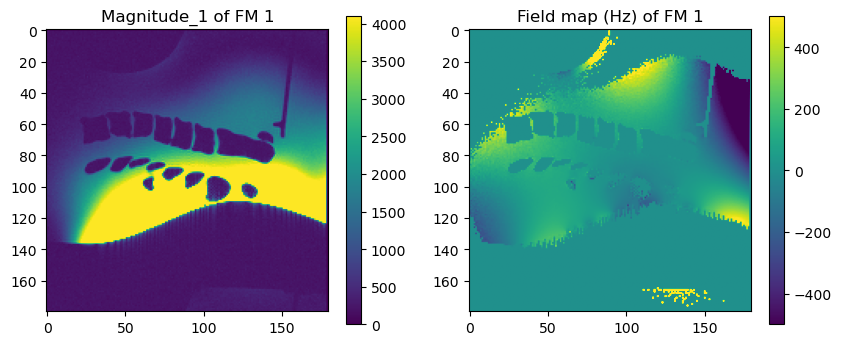

<Figure size 640x480 with 0 Axes>

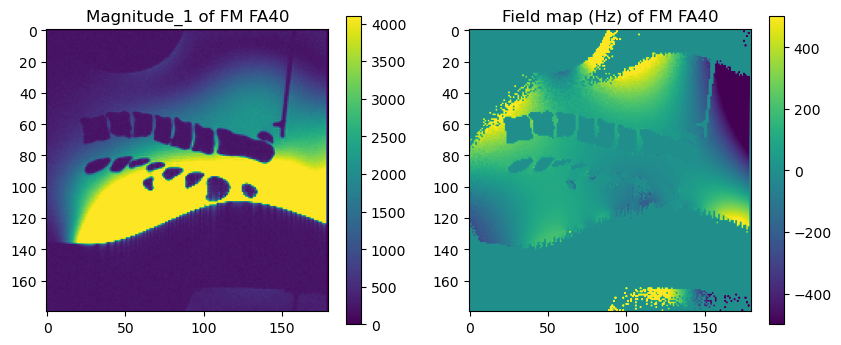

<Figure size 640x480 with 0 Axes>

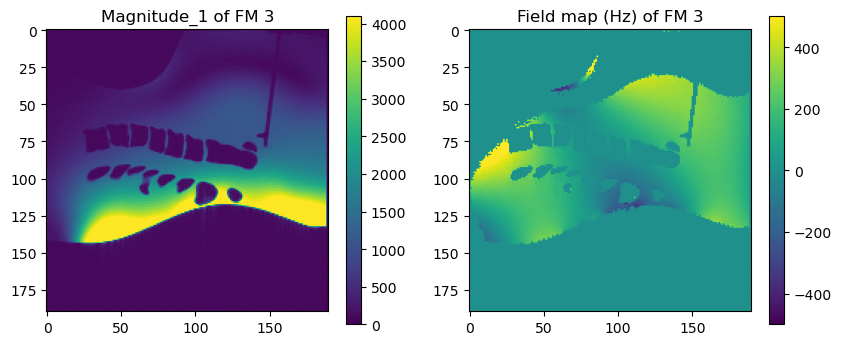

<Figure size 640x480 with 0 Axes>

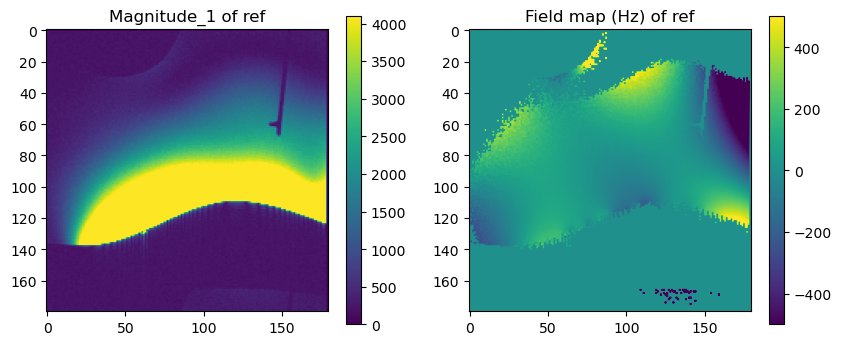

<Figure size 640x480 with 0 Axes>

In [5]:
# 
path_mag1_FM1 = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\FM_1_0MM_BILLY_FIRST_TRY_0007\FM_1_0MM_BILLY_FIRST_TRY_0007_fm_1.0mm_Billy_first_try_20230426150420_7_e1.nii.gz"
path_phase_FM1 = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\FM_1_0MM_BILLY_FIRST_TRY_0008\FM_1_0MM_BILLY_FIRST_TRY_0008_fm_1.0mm_Billy_first_try_20230426150420_8_e2_ph.nii.gz"
delta_B_FM1 = rescale(path_mag1_FM1, path_phase_FM1, "FM 1", delta_TE, masking=True, seuil=400)

path_mag1_FM2 = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\FM_1_0MM_BILLY_FA40_0018\FM_1_0MM_BILLY_FA40_0018_fm_1.0mm_Billy_FA40_20230426150420_18_e1.nii.gz"
path_phase_FM2 = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\FM_1_0MM_BILLY_FA40_0019\FM_1_0MM_BILLY_FA40_0019_fm_1.0mm_Billy_FA40_20230426150420_19_e2_ph.nii.gz"
delta_B_FM2 = rescale(path_mag1_FM2, path_phase_FM2, "FM FA40", delta_TE, masking=True, seuil=400)

path_mag1_FM3 = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\GRE_B0_FIELD_MAPPING_CORRECT_0014\GRE_B0_FIELD_MAPPING_CORRECT_0014_gre_B0_field_mapping_correct_20230426150420_14_e1.nii"
path_phase_FM3 = r"BILLY_PHANTOM_23_04_26\GRE_B0_FIELD_MAPPING_CORRECT_0015_gre_B0_field_mapping_correct_20230426150420_15_e2_ph.nii"
delta_B_FM3 = rescale(path_mag1_FM3, path_phase_FM3, "FM 3", delta_TE, slice=15, masking=True, seuil=400)

path_mag1_FM_ref = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\FM_1_0M_REFERENCE_0021\FM_1_0M_REFERENCE_0021_fm_1.0m_reference_20230426150420_21_e1.nii.gz"
path_phase_FM_ref = r"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\FM_1_0M_REFERENCE_0022\FM_1_0M_REFERENCE_0022_fm_1.0m_reference_20230426150420_22_e2_ph.nii.gz"
delta_B_FM_ref = rescale(path_mag1_FM_ref, path_phase_FM_ref, "ref", delta_TE,  masking=True, seuil=400)


We then try to define a center position of the vertebrae

(180, 180, 160)
(190, 190, 30)


Text(0.5, 1.0, 'Field map (Hz) FM3')

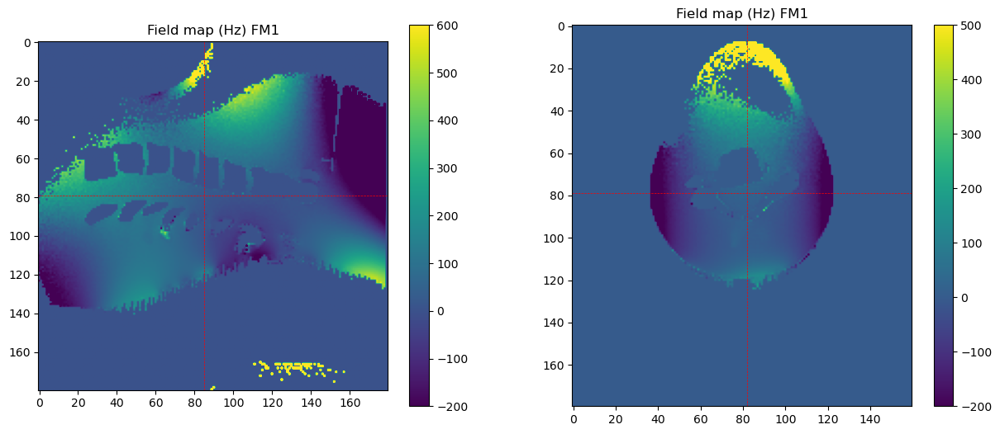

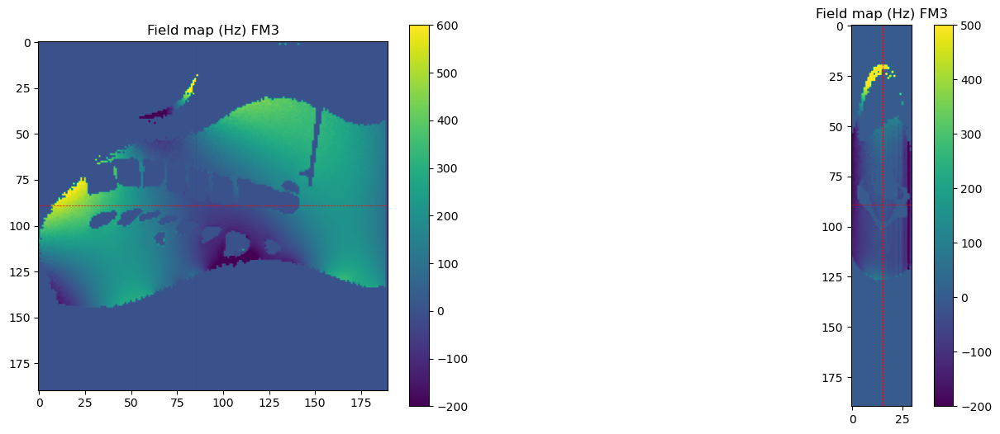

In [6]:
##############################################################################""""""

x_FM1, y_FM1, z_FM1 = 85,79,82
# x_FM2, y_FM2, z_FM2 = 79,79,82 #identical to the previous cooridnates
x_FM3, y_FM3, z_FM3 = 85,89,15

dx, dy, dz = 62,30,40
# dx, dy, dz = 30,30,30
dx_3, dy_3, dz_3 = 60,29, 14
#################################################################################
print(np.shape(delta_B_FM1))
print(np.shape(delta_B_FM3))

plt.figure(figsize=(15,6))

plt.subplot(1,2,1)
plt.imshow(delta_B_FM1[:,:,z_FM1], vmax=600, vmin=-200)
plt.colorbar()
plt.axvline(x=x_FM1,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.axhline(y=y_FM1,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.title(f'Field map (Hz) FM1')

plt.subplot(1,2,2)
plt.imshow(delta_B_FM1[:,x_FM1,:], vmax=500,vmin=-200)
plt.colorbar()
plt.axvline(x=z_FM1,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.axhline(y=y_FM1,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.title(f'Field map (Hz) FM1')


plt.figure(figsize=(15,6))

plt.subplot(1,2,1)
plt.imshow(delta_B_FM3[:,:,z_FM3], vmax=600, vmin=-200)
plt.colorbar()
plt.axvline(x=x_FM3,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.axhline(y=y_FM3,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.title(f'Field map (Hz) FM3')

plt.subplot(1,2,2)
plt.imshow(delta_B_FM3[:,x_FM3,:], vmax=500,vmin=-200)
plt.colorbar()
plt.axvline(x=z_FM3,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.axhline(y=y_FM3,color='r',linestyle='--', linewidth=0.5) #to find the center of the ball
plt.title(f'Field map (Hz) FM3')


By removing the reference background artefacts, one can better visualize the data 

In [7]:
# # If we don't want to remove the background : 
# FM1_large = delta_B_FM1
# FM2_large = delta_B_FM2
FM3_large = delta_B_FM3
# If we want to remove the background : 
FM1_large = (delta_B_FM1-delta_B_FM_ref)
FM2_large = delta_B_FM2-delta_B_FM_ref


In [8]:

# data_mag1=nib.load(path_mag1_FM1).get_fdata() #extract matrix with values
# mag_vertebrae=nib.load(path_mag1_FM_ref).get_fdata()-data_mag1
# mask_test = mag_vertebrae < 400 #return array of booleens
    
    
# plt.figure(figsize=(8,5))
# plt.subplot(1,2,1)
# plt.imshow(mag_vertebrae[:,:,z_FM1])
# plt.colorbar()
# plt.title(f'Magnitude_1 of the corrected magnitude')
    
# plt.subplot(1,2,2)
# plt.imshow(mask_test[:, :, z_FM1])
# plt.colorbar()
# plt.title(f'mask of the vertebrae corrected')
    
# plt.tight_layout()

Define a mask of the vertebrae

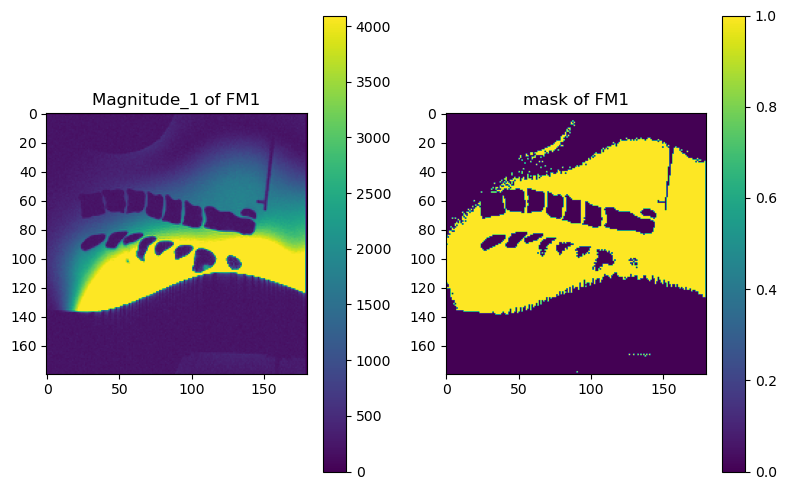

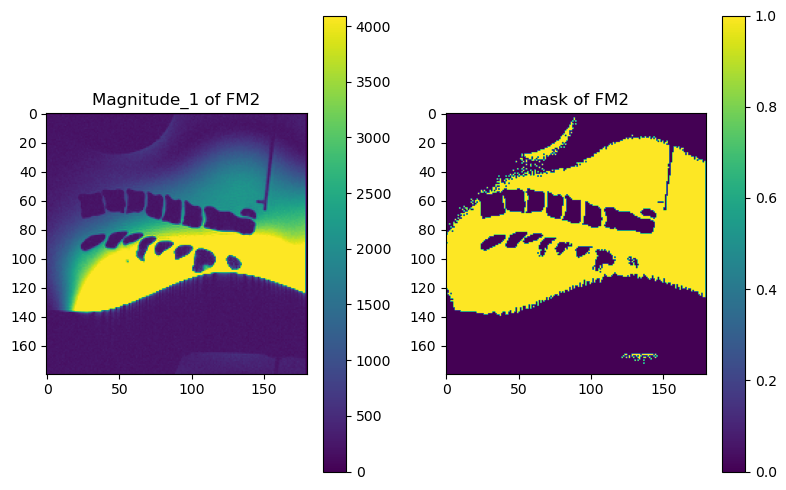

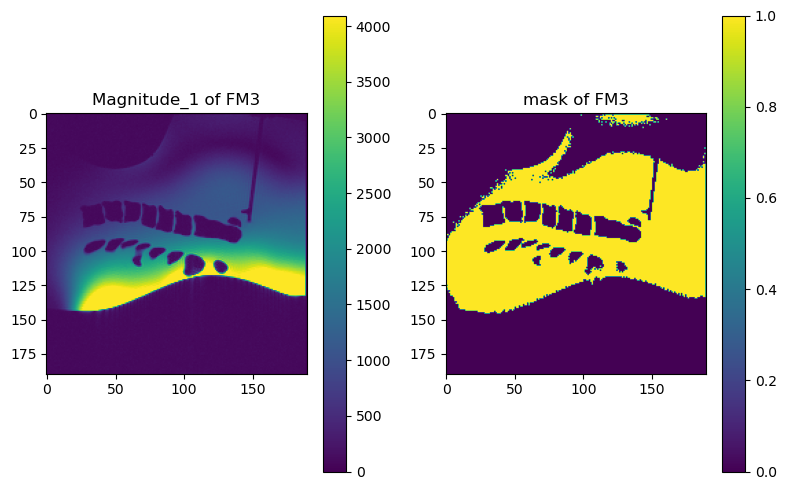

In [9]:
mask_FM1_large = mask(path_mag1_FM1, 'FM1', tresh=440, plot=True, slice=z_FM1)
mask_FM2_large = mask(path_mag1_FM2, 'FM2', tresh=500, plot=True, slice=z_FM1)
mask_FM3_large = mask(path_mag1_FM3, 'FM3', tresh=300, plot=True, slice=z_FM3)

Reshaping the FM to restrict to the space around the vertebrae

In [10]:
def rescaling_FOV(field_map, x, y, z, dx=dx, dy=dy, dz=dz):
    '''
    Reshape field_map to a smaller array

    Create a new smaller matrix of volume 2dx*2dy*2dz with values recentered on x,y,z
    Attention: x is the second component and y the first one.

    Parameters
    ----------
    field_map : numpy.ndarray
        3D array pf the FM to reshape.
    x : int
        x coordinate around which field_map will be reshaped
    y : int
        y coordinate around which field_map will be reshaped
    z : int
        z coordinate around which field_map will be reshaped
    dx : int, optional
        0.5*width along the x direction of the reshaped matrix. The default is dx.
    dy : int, optional
        0.5*width along the y direction of the reshaped matrix. The default is dy.
    dz : int, optional
        0.5*width along the z direction of the reshaped matrix. The default is dz.
            
    Returns
    -------
    rescaled_matrix : numpy.ndarray
        Reshaped 3D array.

    '''
    rescaled_matrix= field_map[y-dy:y+dy+1, x-dx:x+dx+1, z-dz: z+dz+1] 
   
    return rescaled_matrix

In [11]:
mask_FM1 = rescaling_FOV(mask_FM1_large, x=x_FM1, y=y_FM1, z=z_FM1)
FM1 = rescaling_FOV(FM1_large, x_FM1, y_FM1, z_FM1)*mask_FM1

mask_FM2 = rescaling_FOV(mask_FM2_large, x=x_FM1, y=y_FM1, z=z_FM1)
FM2 = rescaling_FOV(FM2_large, x_FM1, y_FM1, z_FM1)*mask_FM2

mask_FM3 = rescaling_FOV(mask_FM3_large, x=x_FM3, y=y_FM3, z=z_FM3, dx=dx_3, dy=dy_3, dz=dz_3)
FM3 = rescaling_FOV(FM3_large, x_FM3, y_FM3, z_FM3, dx=dx_3, dy=dy_3, dz=dz_3)*mask_FM3


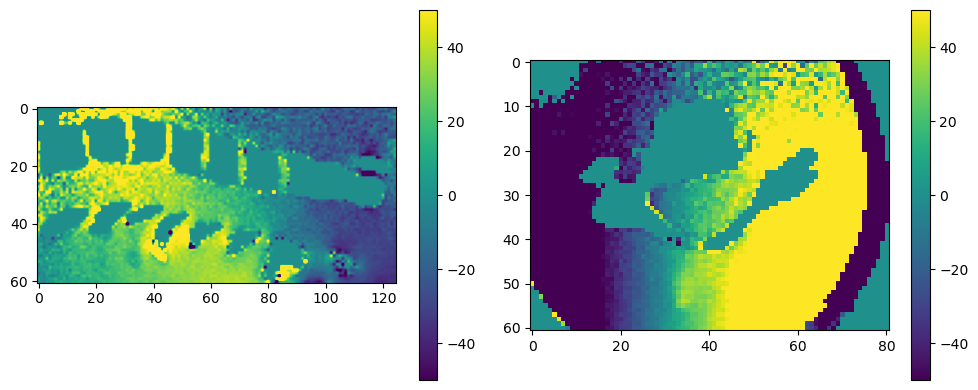

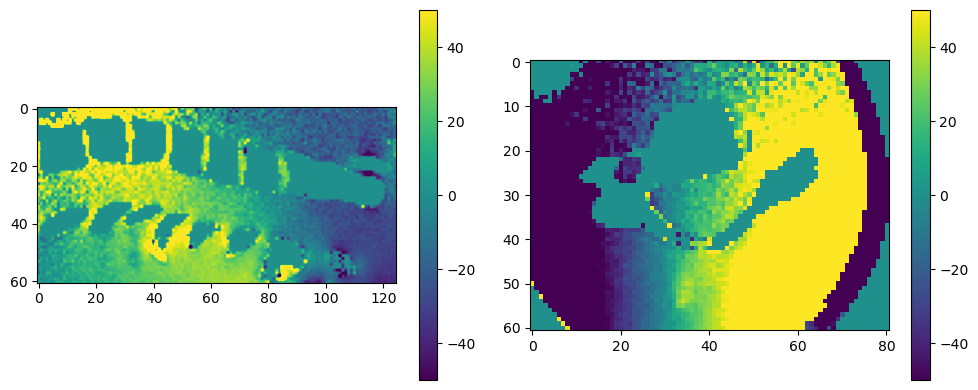

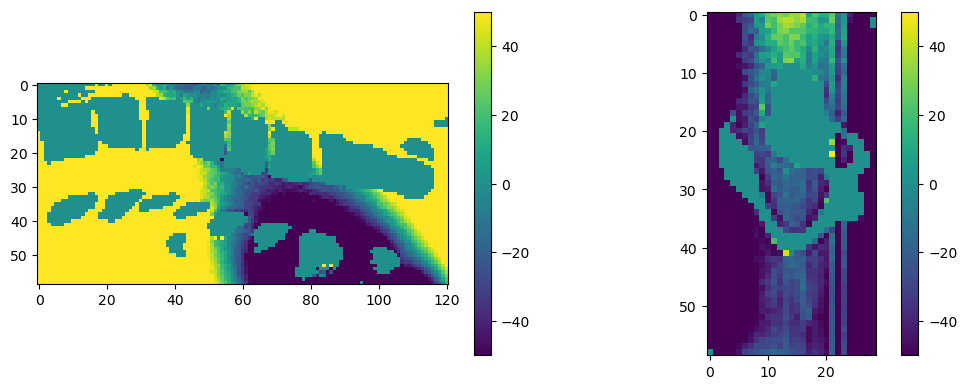

In [12]:
vmin=-50
vmax=50
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(FM1[:,:,dz], vmax=vmax, vmin=vmin)
plt.colorbar()
plt.subplot(122)
plt.imshow(FM1[:,dx,:], vmax=vmax, vmin=vmin)
plt.colorbar()
plt.tight_layout()

plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(FM2[:,:,dz], vmax=vmax, vmin=vmin)
plt.colorbar()
plt.subplot(122)
plt.imshow(FM2[:,dx,:], vmax=vmax, vmin=vmin)
plt.colorbar()
plt.tight_layout()

plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(FM3[:,:,dz_3], vmax=vmax, vmin=vmin)
plt.colorbar()
plt.subplot(122)
plt.imshow(FM3[:,dx_3,:], vmax=vmax, vmin=vmin)
plt.colorbar()
plt.tight_layout()


Correction of the linear gradients in the background/

In [13]:
def calcul_gradient_3D(fm, mask, mode='normal'):
    """
    Calculate the gradients of a 3D image along the x, y, and z axes. 
    
    If mode='linear', calculate the linear gradients instead.

    Parameters
    ----------
    fm : numpy.ndarray
        3D array with want to compute the gradients of.
    mask : numpy.ndarray
        3D array mask of the FM.
    mode : str, optional
        mode of calculation. Can be 'normal' or 'linear'. The default is 'normal'
        
   Returns
    -------
    (y_grad, x_grad, z_grad) : tuple of numpy ndarrays
        The gradient along the y, x, and z axes.

    """
    
    m,n,p = np.shape(fm)
    X_abs = np.array([i for i in range(n)])
    Y_abs = np.array([i for i in range(m)])
    Z_abs = np.array([i for i in range(p)])

    
    # gradient z axis
    z_grad = []
    for i in range(p):
        s_avg = np.average(fm[:,:,i], weights=mask[:,:,i])
        z_grad.append(s_avg)
    
    # gradient x axis (horizontal)
    x_grad = []
    for i in range(n):
        s_avg = np.average(fm[:,i,:], weights=mask[:,i,:])
        x_grad.append(s_avg)

    # gradient y axis (vertical)
    y_grad = []
    for i in range(m):
        s_avg = np.average(fm[i,:,:], weights=mask[i,:,:])
        y_grad.append(s_avg)
 
    
    plt.figure()       
    plt.plot(Z_abs, z_grad, label='z_axis')
    plt.plot(X_abs, x_grad, label='horizontal')
    plt.plot(Y_abs, y_grad, label='vertical')
    
    
    
    if mode=='linear':
        res_z = scipy.stats.linregress(Z_abs, z_grad)
        res_x = scipy.stats.linregress(X_abs, x_grad)
        res_y = scipy.stats.linregress(Y_abs, y_grad)
        z_grad = res_z.intercept + res_z.slope*Z_abs
        x_grad=res_x.intercept + res_x.slope*X_abs
        y_grad = res_y.intercept + res_y.slope*Y_abs
        plt.plot(Z_abs, res_z.intercept + res_z.slope*Z_abs, label='z')
        plt.plot(X_abs, res_x.intercept + res_x.slope*X_abs, label='x')
        plt.plot(Y_abs, res_y.intercept + res_y.slope*Y_abs, label='y')
    plt.legend()

    return(y_grad, x_grad, z_grad)

def correct_grad3D(fm, mask, y_grad, x_grad, z_grad, slice=40):
    """
    Correct for 3D gradient artifacts in a 3D image.
        
    Parameters
    ----------
    fm : numpy.ndarray
        3D array with want to correct.
    mask : numpy.ndarray
        3D array mask of the FM.
    y_grad : numpy.ndarray
        1D gradient along the y-axis
    x_grad : numpy.ndarray
        1D gradient along the x-axis
    z_grad : numpy.ndarray
        1D gradient along the z-axis
    slice : int, optional
        slice of the FM to plot. the default is 40
   Returns
    -------
    fm_exp_gradcorrected*mask : numpy ndarray
        3D array of the corrected FM
    """    
    
    # correction
    m,n,p=np.shape(fm)
    fm_exp_gradcorrected = np.zeros((m,n,p))
    for i in range(m):
        for j in range(n):
            for k in range(p):
                fm_exp_gradcorrected[i,j,k] = fm[i,j,k] - y_grad[i] -x_grad[j] - z_grad[k]
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)         
    plt.imshow(fm[:,:,slice], vmin=-50, vmax=50)
    plt.colorbar()
    plt.subplot(1,2,2)         
    plt.imshow((fm_exp_gradcorrected*mask)[:,:,slice], vmin=-50, vmax=50)
    plt.colorbar()
    
    avg_backg = np.average(fm_exp_gradcorrected, weights = mask)
    print(f'The average background of the linearly corrected fm, backgound corrected, is {avg_backg}')
    fm_exp_gradcorrected = (fm_exp_gradcorrected - avg_backg)*mask
    return fm_exp_gradcorrected


In [14]:
def correction(fm, mask, slice_z, slice_x, mode='normal', sigma=0.5, vmin=-30, vmax=30):
    '''
    Correct the fm by subtracting the gradients, smoothing it and removing the background
    
    If mode='linear', calculate the linear gradients instead
    
    Parameters
    ----------
    fm : numpy.ndarray
        3D array with want to correct.
    mask : numpy.ndarray
        3D array mask of the FM.
    slice_z : int
        sagittal slice of the FM to plot.
    slice_x: int
        transversal slice of the FM to plot. 
    mode : str, optional
        Mode of calculation. Can be 'normal' or 'linear'. the default is 'normal'
    sigma: float, optional
        Standrad deviation of the Gaussian filter. the default is 0.5
    vmin: float, optional
        Minimum value of the final scale. the default is -30
    vmax: float, optional
        maximum value of the final scale. the default is 30
   Returns
    -------
    FM_final : numpy ndarray
        3D array of the corrected FM
    '''
    y_grad, x_grad, z_grad= calcul_gradient_3D(fm, mask, mode=mode)
    fm_corrected = correct_grad3D(fm ,mask, y_grad, x_grad, z_grad, slice=slice_z)
    
    fm_corrected_2 = gaussian_filter(fm_corrected, sigma=sigma)

    avg_backg_fm_corrected_2 = np.average(fm_corrected_2, weights = mask)
    print(f'The average background of the smoothed, gradient corrected FM, is {avg_backg_fm_corrected_2}')
    FM_final = (fm_corrected_2 - avg_backg_fm_corrected_2)*mask
    plt.figure(figsize=(10,8))
    plt.imshow(FM_final[:,:,slice_z], vmin=vmin, vmax=vmax)
    plt
    plt.colorbar()
    plt.figure(figsize=(10,8))
    plt.imshow(FM_final[:,slice_x,:], vmin=vmin, vmax=vmax)
    plt.colorbar()
    
    return FM_final

The average background of the linearly corrected fm, backgound corrected, is -14.685131935319886
The average background of the smoothed, gradient corrected FM, is -0.6074968396789355


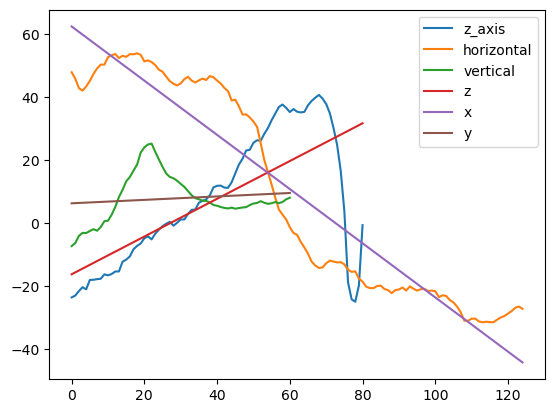

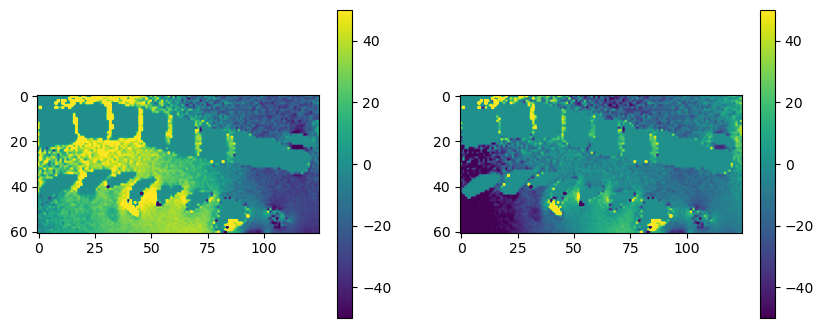

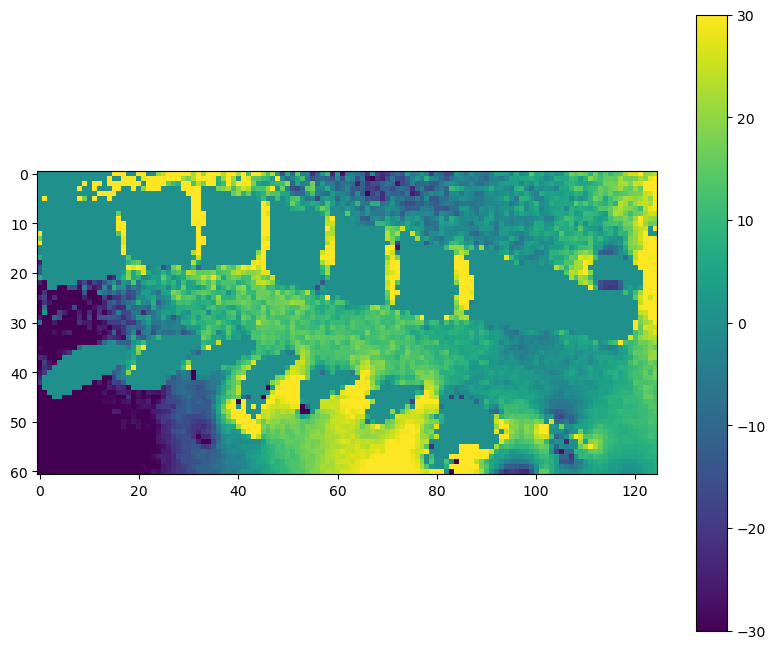

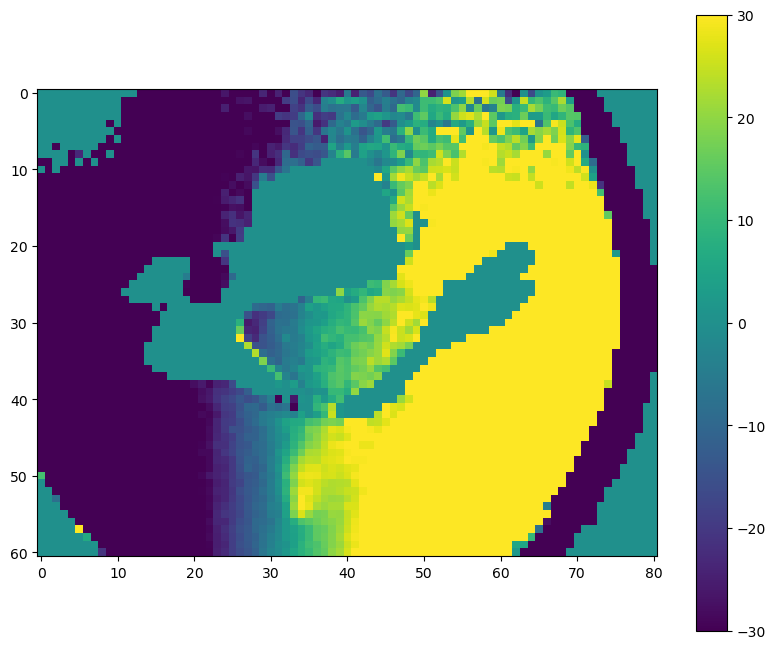

In [15]:
FM1_final = correction(fm=FM1, mask=mask_FM1, slice_z = dz, slice_x =dx , mode='linear', sigma=0.5, vmin=-30, vmax=30)

The average background of the linearly corrected fm, backgound corrected, is -21.08589507098938
The average background of the smoothed, gradient corrected FM, is -0.5729456081056366


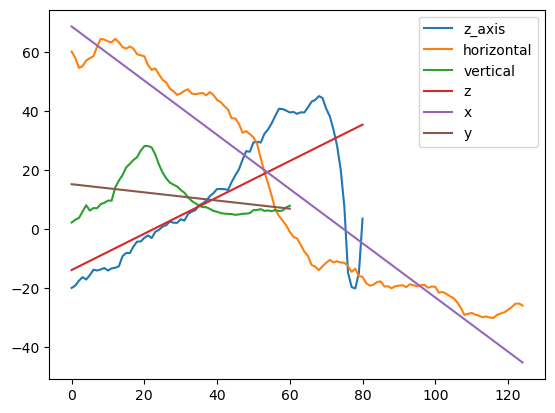

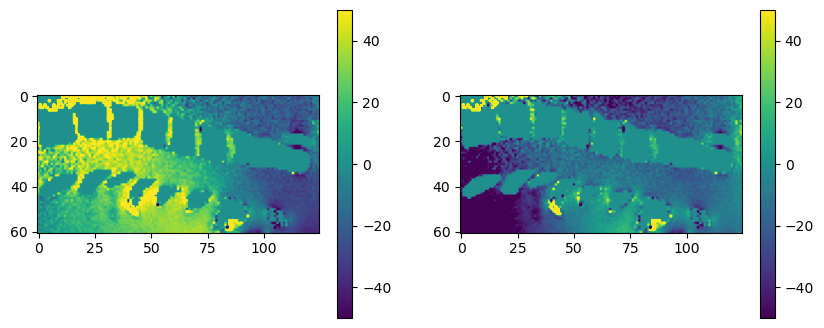

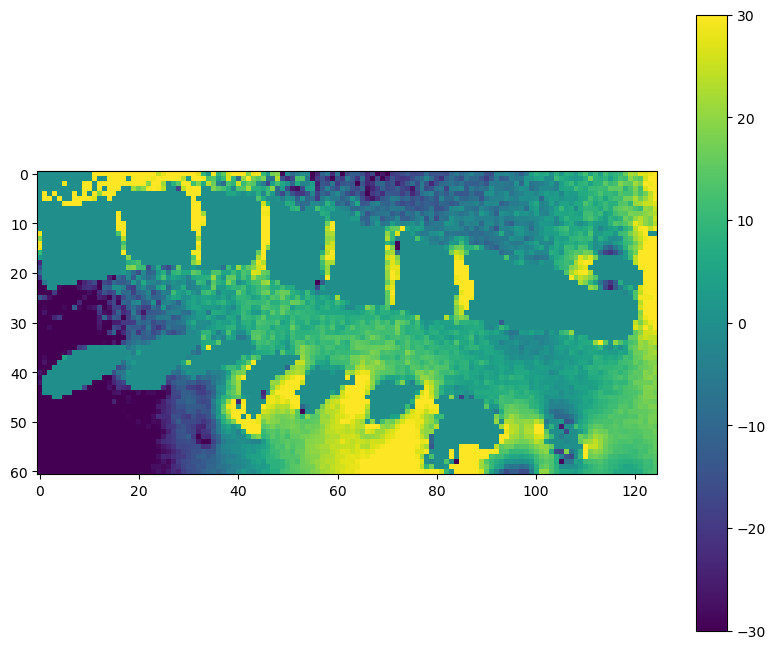

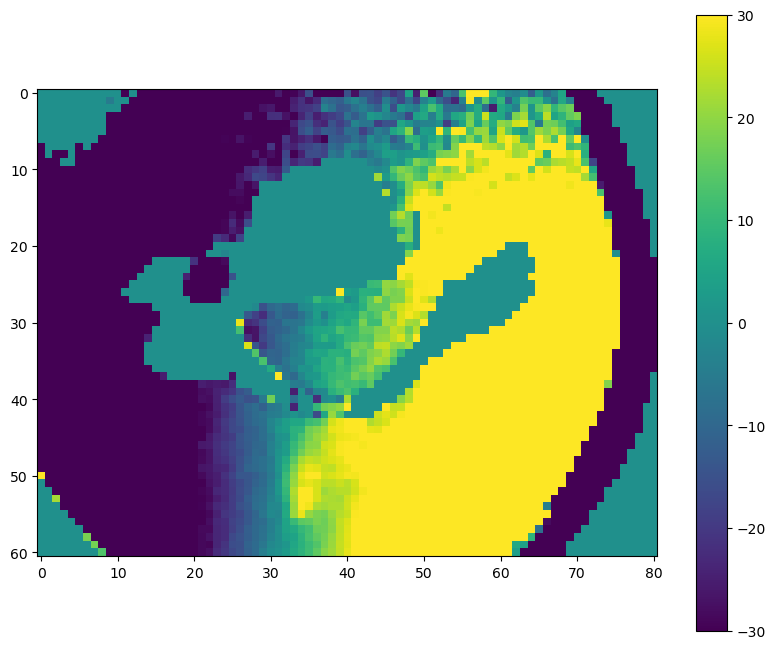

In [16]:
FM2_final = correction(fm=FM2, mask=mask_FM2, slice_z = dz, slice_x =dx , mode='linear', sigma=0.5)

The average background of the linearly corrected fm, backgound corrected, is -166.56433721175713
The average background of the smoothed, gradient corrected FM, is 0.9956475672691797


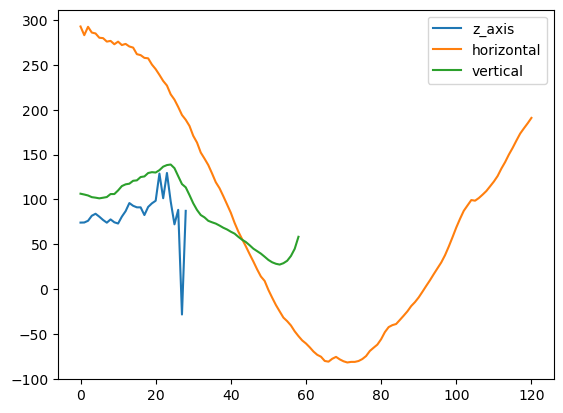

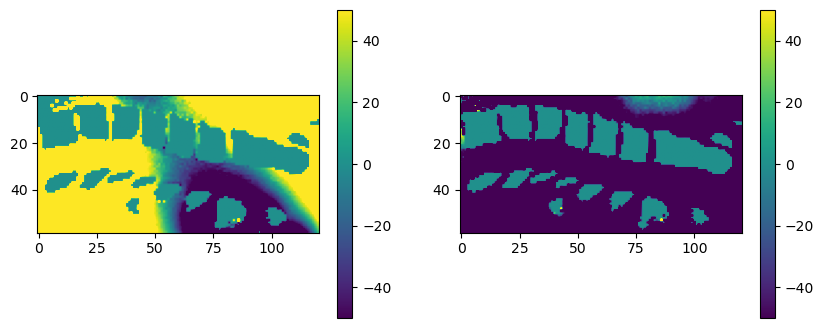

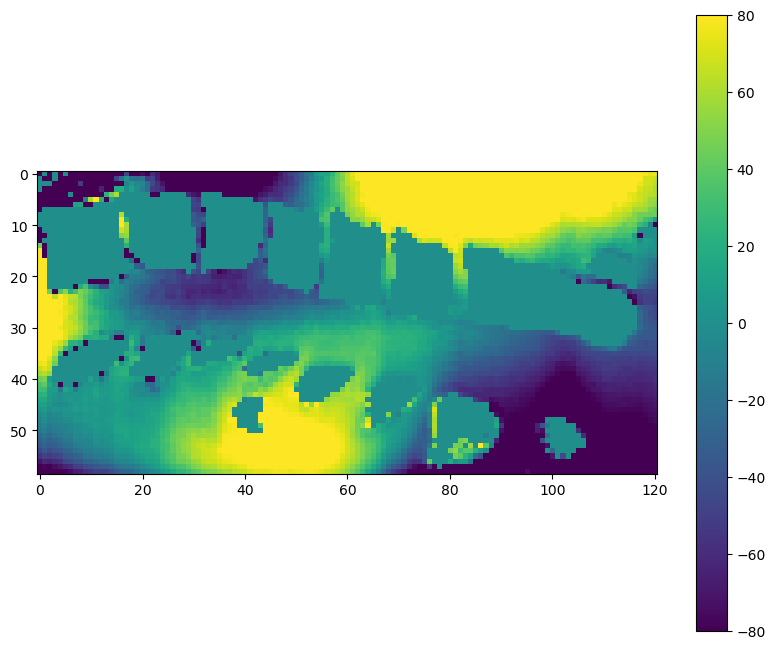

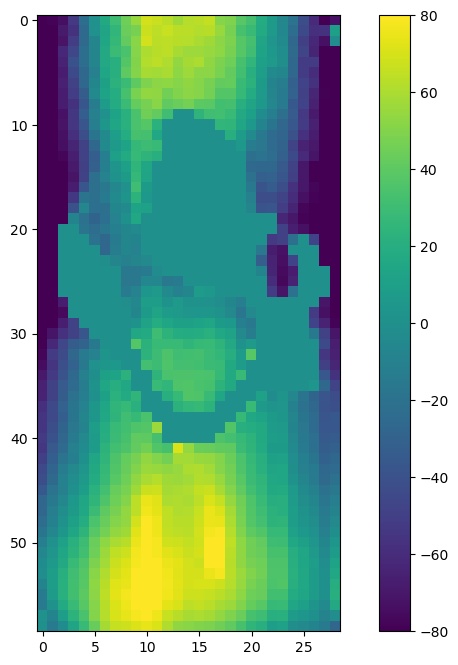

In [17]:
FM3_final = correction(fm=FM3, mask=mask_FM3, slice_z = dz_3, slice_x =dx_3 , mode='normal', sigma=0.5, vmin=-80, vmax=80)

Export the mask to Matlab

(61, 125, 81)
(61, 125, 81)
(59, 121, 29)


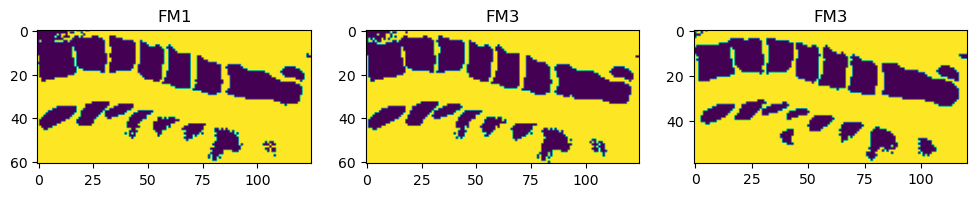

In [18]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.title('FM1')
plt.imshow(mask_FM1[:,:,dz])
plt.subplot(132)
plt.title('FM3')
plt.imshow(mask_FM2[:,:,dz])
plt.subplot(133)
plt.title('FM3')
plt.imshow(mask_FM3[:,:,dz_3])

# ## save and export the masks in matlab format to run the simulation on them
# mdic = {"mask_FM1": mask_FM1, "label": "mask_FM1"}
# savemat("mask_FM1.mat", mdic)
# mdic = {"mask_FM2": mask_FM2, "label": "mask_FM2"}
# savemat("mask_FM2.mat", mdic)
# mdic = {"mask_FM3": mask_FM3, "label": "mask_FM3"}
# savemat("mask_FM3.mat", mdic)
print(np.shape(mask_FM1))
print(np.shape(mask_FM2))
print(np.shape(mask_FM3))

In [19]:
simu_mask_FM1 = -(scipy.io.loadmat(r"I_FM1.mat")['I'][119:180, 87:212, 109:190]-1)
simu_FM1 = scipy.io.loadmat(r"I_sus_FM1.mat")['I_sus'][119:180, 87:212, 109:190].real * simu_mask_FM1

print(np.shape(simu_mask_FM1))
print(np.shape(simu_FM1))

simu_mask_FM1 = -(scipy.io.loadmat(r"I_FM1.mat")['I'][119:180, 87:212, 109:190]-1)
simu_FM1 = scipy.io.loadmat(r"I_sus_FM1.mat")['I_sus'][119:180, 87:212, 109:190].real * simu_mask_FM1

simu_mask_FM2 = -(scipy.io.loadmat(r"I_FM2.mat")['I'][119:180, 87:212, 109:190]-1)
simu_FM2 = scipy.io.loadmat(r"I_sus_FM2.mat")['I_sus'][119:180, 87:212, 109:190].real * simu_mask_FM2

simu_mask_FM3 = -(scipy.io.loadmat(r"I_FM3.mat")['I'][120:179, 89:210, 135:164]-1)
simu_FM3 = scipy.io.loadmat(r"I_sus_FM3.mat")['I_sus'][120:179, 89:210, 135:164].real * simu_mask_FM3


(61, 125, 81)
(61, 125, 81)


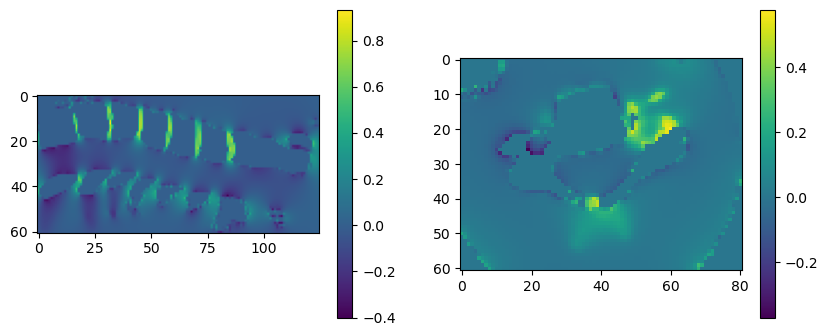

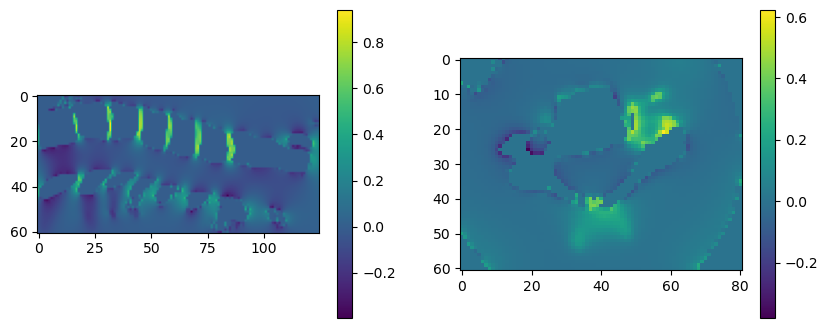

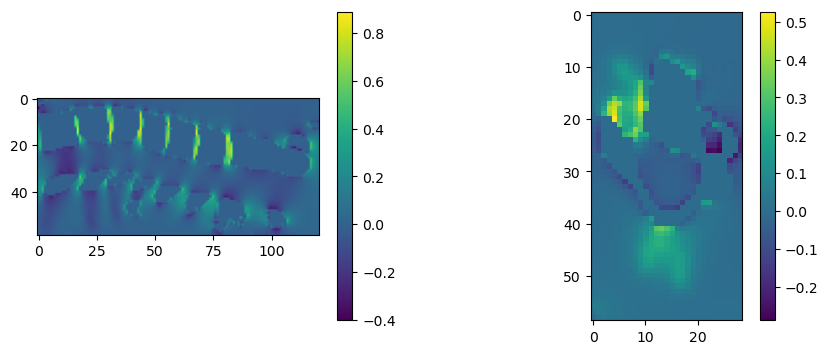

In [20]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(simu_FM1[:,:,dz])
plt.colorbar()
plt.subplot(122)
plt.imshow(simu_FM1[:,dx,:])
plt.colorbar()

plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(simu_FM2[:,:,dz])
plt.colorbar()
plt.subplot(122)
plt.imshow(simu_FM2[:,dx,:])
plt.colorbar()

plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(simu_FM3[:,:,dz_3])
plt.colorbar()
plt.subplot(122)
plt.imshow(simu_FM3[:,dx_3,:])
plt.colorbar()

Then we need to check the superposition of the simulated and acquired mask

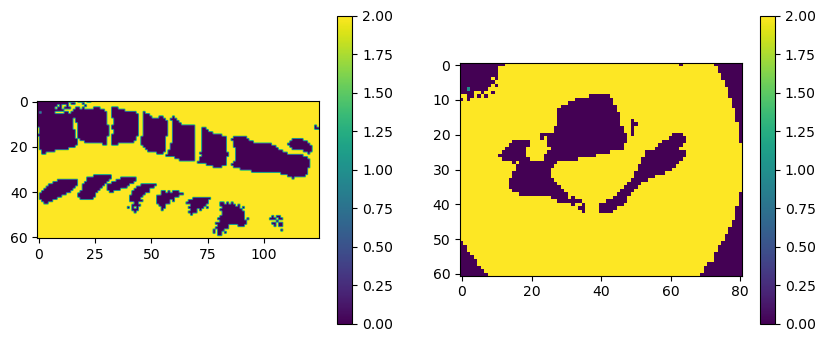

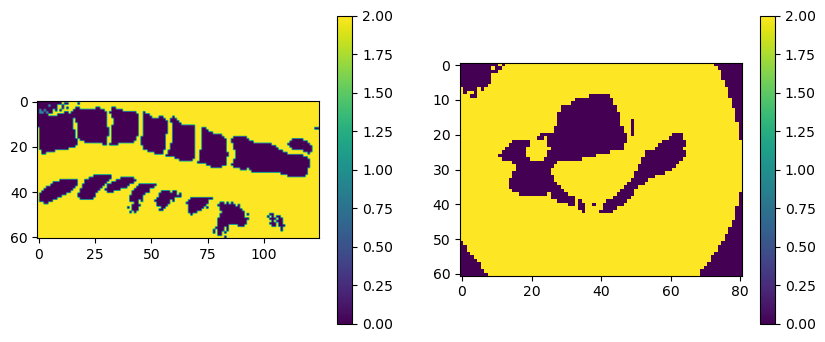

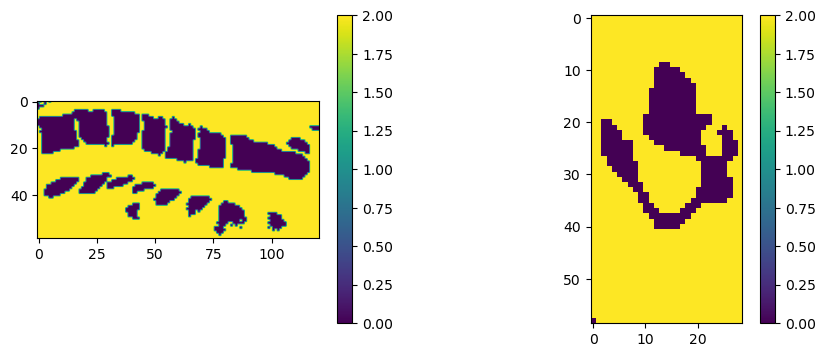

In [21]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow((mask_FM1+simu_mask_FM1)[:,:,dz])
plt.colorbar()
plt.subplot(122)
plt.imshow((mask_FM1+simu_mask_FM1)[:,dx,:])
plt.colorbar()

plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow((mask_FM2+simu_mask_FM2)[:,:,dz])
plt.colorbar()
plt.subplot(122)
plt.imshow((mask_FM2+simu_mask_FM2)[:,dx,:])
plt.colorbar()

plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow((mask_FM3+simu_mask_FM3)[:,:,dz_3])
plt.colorbar()
plt.subplot(122)
plt.imshow((mask_FM3+simu_mask_FM3)[:,dx_3,:])
plt.colorbar()

## Linear regression between the simulation and acquisition

In [22]:
def linear_reg_simexp(fm_simu1, fm_exp1, mask_simu1, mask_exp1, part, xmin, ymin, zmin, xmax, ymax, zmax, vmin=-30, vmax=30):
    '''
    Calculate the linear regression between `fm_simu1` and `fm_exp1`, excluding the values inside the masks (inside the compound).

    
    The regression between fm_simu1 and fm_exp1 is calculated on the voxels which coordinates are inside [xmin,xmax],[ymin,ymax],[zmin,zmax]
    Attention: x is the second component and y the first one.
    Plot the linear regression, one slice of the simulated and acquired field map and the histogram of the error. 
    
    Parameters
    ----------
    fm_simu1 : np.ndarray
        3D array of the simulated FM.
    fm_exp1 : np.ndarray
        3D array of the acquired FM.
    mask_simu1 : np.ndarray
        3D array of the simulated mask.
    mask_exp1 : np.ndarray
        3D array of the acquired mask.
    part : str
        description of the compound.
    xmin : int
        the minimum x value to use for the regression calculation.
    ymin : int 
        the minimum y value to use for the regression calculation. 
    zmin : int
        the minimum z value to use for the regression calculation. 
    xmax : int 
        the maximum x value to use for the regression calculation. 
    ymax : int 
        the maximum y value to use for the regression calculation. 
    zmax : int 
        the maximum z value to use for the regression calculation. 
    vmin : int, optional
        Lower limit of the color scale. The default is -30.
    vmax : int, optional
        Higher limit of the color scale. The default is +30.

    Returns
    -------
    result_corrected : scipy.stats._stats_mstats_common.LinregressResult
        A tuple containing the parameters of the regression line.

    '''
  
    ### reshaping to 1D vector
    
    fm_simu=fm_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
    fm_exp=fm_exp1[ymin:ymax, xmin:xmax, zmin:zmax]
    mask_simu2=mask_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
    mask_exp2=mask_exp1[ymin:ymax, xmin:xmax, zmin:zmax]

    m,n,p = fm_simu.shape
    simu = fm_simu.reshape(m*n*p) #need to have vector 1D to apply the linear regression
    exp = fm_exp.reshape(n*m*p)

    mask_exp = mask_exp2.reshape(m*n*p)
    mask_simu = mask_simu2.reshape(m*n*p)

    exp_corrected = []
    simu_corrected=[]

    for i in range(m*p*n):
        if mask_exp[i]!=0 and mask_simu[i]!=0:
            simu_corrected.append(simu[i])
            exp_corrected.append(exp[i])

    ### regression lineaire
    result_corrected = scipy.stats.linregress(simu_corrected, exp_corrected)
    print(f'######## regression linéaire - {part} ############')
    print(f' fm_exp = {result_corrected.slope} * fm_simu + {result_corrected.intercept} ')
    print(f'R^2 = {result_corrected.rvalue **2}')
    print(f'p-value = {result_corrected.pvalue }')


    #######################"" plot################################
    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.plot(simu_corrected, exp_corrected, '.', c='pink', label=part)
    plt.xlabel('Simulation')
    plt.ylabel('Experience')
    plt.title(f'Correlation between simulation and experience on {part}')
    plt.plot(simu, result_corrected.intercept + result_corrected.slope*simu, 'b')
#     plt.legend()
    
    plt.subplot(122) #histogram of the error
    approx = np.array([result_corrected.intercept + result_corrected.slope*simu_corrected[i] for i in range(len(simu_corrected))])
    error = exp_corrected - approx #f(xi)-y
    plt.hist(error, bins=75)
    plt.title('Histogram of the error f(xi)-y')
    plt.tight_layout()
    plt.show()
    
    plt.figure()
    plt.subplot(2,2,1)
    plt.imshow(result_corrected.slope*fm_simu[:,int((xmax-xmin)/2), :], vmin=vmin, vmax=vmax)
    plt.title("simu corrected")
    plt.colorbar()
    plt.subplot(2,2,2)
    plt.imshow(result_corrected.slope*fm_simu[:,:, int((zmax-zmin)/2)],  vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.subplot(2,2,3)
    plt.title("measurements")
    plt.colorbar()
    plt.imshow(fm_exp[:,int((xmax-xmin)/2), :],  vmin=vmin, vmax=vmax)
    plt.subplot(2,2,4)
    plt.imshow(fm_exp[:,:, int((zmax-zmin)/2)],  vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.tight_layout()
    plt.show()

    
    print(np.shape(fm_simu))
    return result_corrected

######## regression linéaire - FM1 clean ############
 fm_exp = 41.872854008674935 * fm_simu + 9.135765028286894 
R^2 = 0.09132820210320551
p-value = 0.0


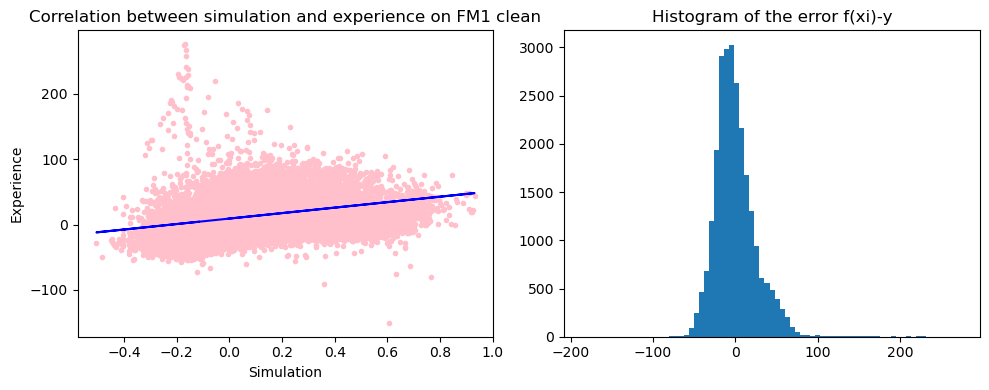

C:\Users\b\AppData\Local\Temp\ipykernel_5792\1934818779.py:104: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar()


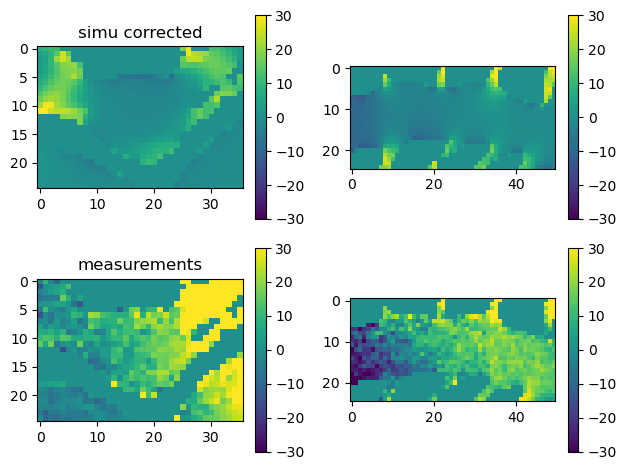

(25, 50, 36)


In [23]:
result_FM1 = linear_reg_simexp(fm_simu1 = simu_FM1 , fm_exp1 =FM1_final, mask_simu1 = simu_mask_FM1, mask_exp1=mask_FM1, part="FM1 clean", xmin = 10, ymin=15, zmin=23,  xmax=60, ymax=40, zmax=59)

######## regression linéaire - FM1 ############
 fm_exp = 21.006800135185582 * fm_simu + 14.961292465801645 
R^2 = 0.019861225744566894
p-value = 3.5981466289027024e-152


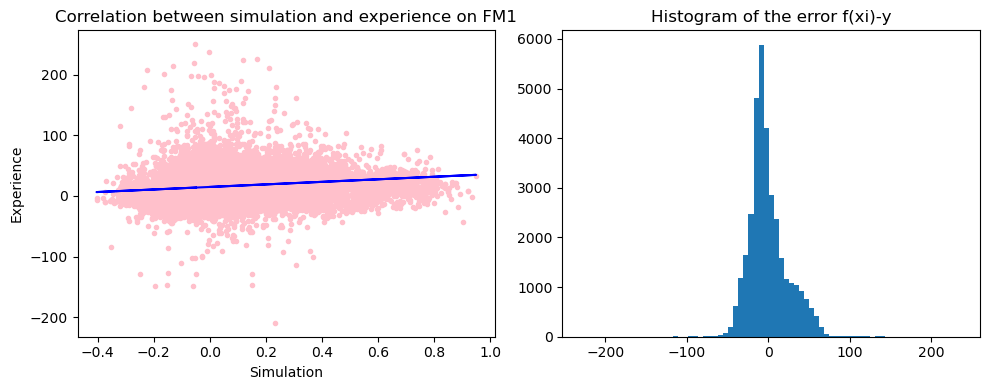

C:\Users\b\AppData\Local\Temp\ipykernel_5792\1934818779.py:104: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar()


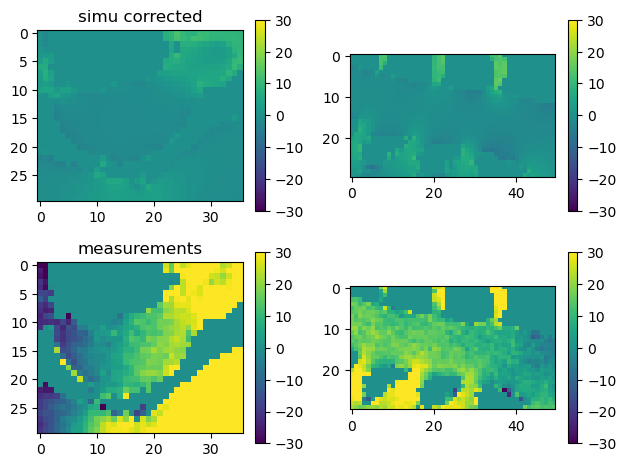

(30, 50, 36)


In [24]:
result_FM1 = linear_reg_simexp(fm_simu1 = simu_FM1 , fm_exp1 =FM1_final, mask_simu1 = simu_mask_FM1, mask_exp1=mask_FM1, part="FM1", xmin = 50, ymin=20, zmin=23,  xmax=100, ymax=50, zmax=59)

######## regression linéaire - FM2 ############
 fm_exp = 19.22602514076837 * fm_simu + 14.753411655235935 
R^2 = 0.01783053553418009
p-value = 5.960114246057445e-136


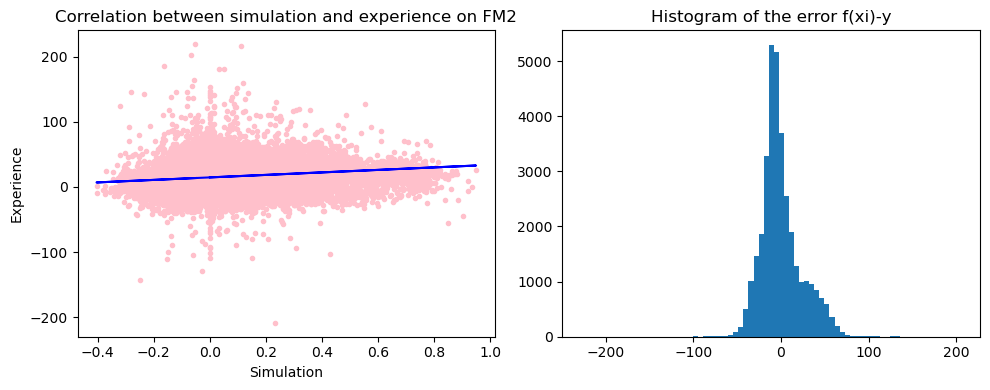

C:\Users\b\AppData\Local\Temp\ipykernel_5792\1934818779.py:104: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar()


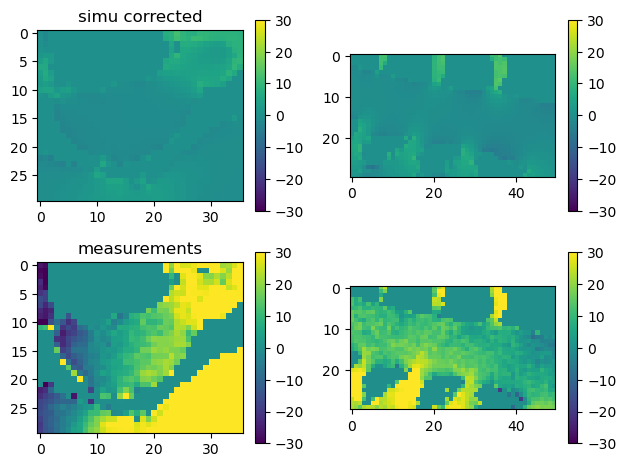

(30, 50, 36)


In [25]:
result_FM2 = linear_reg_simexp(fm_simu1 = simu_FM1 , fm_exp1 =FM2_final, mask_simu1 = simu_mask_FM2, mask_exp1=mask_FM2, part="FM2", xmin = 50, ymin=20, zmin=23,  xmax=100, ymax=50, zmax=59)

######## regression linéaire - FM3 ############
 fm_exp = -55.229254480867866 * fm_simu + 0.9889598008882218 
R^2 = 0.024425163293613782
p-value = 3.0309538793131497e-79


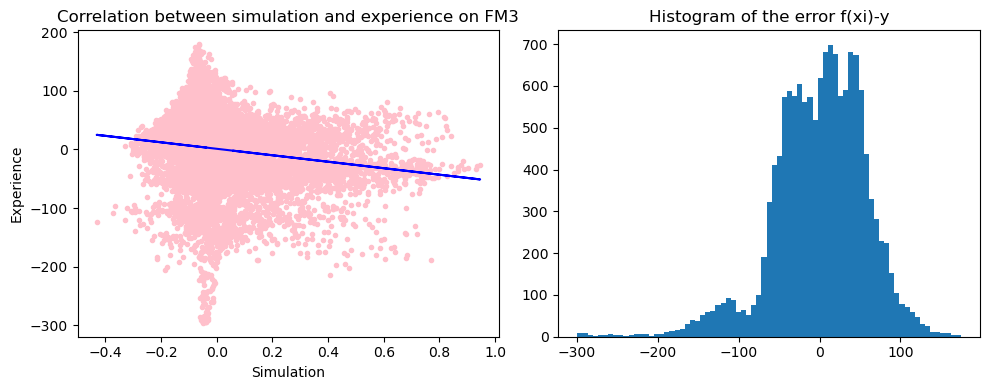

C:\Users\b\AppData\Local\Temp\ipykernel_5792\1934818779.py:104: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  plt.colorbar()


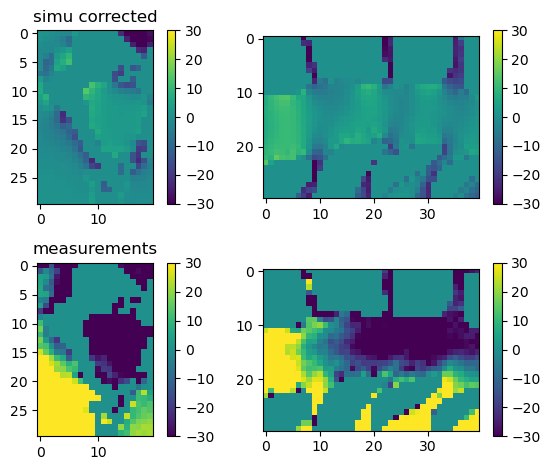

(30, 40, 20)


In [26]:
result_FM3 = linear_reg_simexp(fm_simu1 = simu_FM3 , fm_exp1 =FM3_final, mask_simu1 = simu_mask_FM3, mask_exp1=mask_FM3, part="FM3", xmin = 10, ymin=10, zmin=0,  xmax=50, ymax=40, zmax=20)

In [27]:
def linear_reg_simexp_clean(fm_simu1, fm_exp1, mask_simu1, mask_exp1, part, xmin, ymin, zmin, xmax, ymax, zmax):
    '''
    Calculate the linear regression between `fm_simu1` and `fm_exp1`, excluding the values inside the masks (inside the compound).

    
    The regression between fm_simu1 and fm_exp1 is calculated on the voxels which coordinates are inside [xmin,xmax],[ymin,ymax],[zmin,zmax]
    Attention: x is the second component and y the first one.
    Plot the linear regression, one slice of the simulated and acquired field map and the histogram of the error. 
    Better format for exportation 
    
    Parameters
    ----------
    fm_simu1 : np.ndarray
        3D array of the simulated FM.
    fm_exp1 : np.ndarray
        3D array of the acquired FM.
    mask_simu1 : np.ndarray
        3D array of the simulated mask.
    mask_exp1 : np.ndarray
        3D array of the acquired mask.
    part : str
        description of the compound.
    xmin : int
        the minimum x value to use for the regression calculation.
    ymin : int
        the minimum y value to use for the regression calculation.
    zmin : int
        the minimum z value to use for the regression calculation. 
    xmax : int
        the maximum x value to use for the regression calculation. 
    ymax : int
        the maximum y value to use for the regression calculation.
    zmax : int
        the maximum z value to use for the regression calculation.
    

    Returns
    -------
    result_corrected : scipy.stats._stats_mstats_common.LinregressResult
        A tuple containing the parameters of the regression line.

    '''
    ### reshaping to 1D vector
    
    fm_simu=fm_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
    fm_exp=fm_exp1[ymin:ymax, xmin:xmax, zmin:zmax]
    mask_simu2=mask_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
    mask_exp2=mask_exp1[ymin:ymax, xmin:xmax, zmin:zmax]

    m,n,p = fm_simu.shape
    simu = fm_simu.reshape(m*n*p) #need to have vector 1D to apply the linear regression
    exp = fm_exp.reshape(n*m*p)

    mask_exp = mask_exp2.reshape(m*n*p)
    mask_simu = mask_simu2.reshape(m*n*p)

    exp_corrected = []
    simu_corrected=[]

    for i in range(m*p*n):
        if mask_exp[i]!=0 and mask_simu[i]!=0:
            simu_corrected.append(simu[i])
            exp_corrected.append(exp[i])

    ### regression lineaire
    result_corrected = scipy.stats.linregress(simu_corrected, exp_corrected)
    print(f'######## regression linéaire - {part} ############')
    print(f' fm_exp = {result_corrected.slope} * fm_simu + {result_corrected.intercept} ')
    print(f'R^2 = {result_corrected.rvalue **2}')
    print(f'p-value = {result_corrected.pvalue }')


    #######################"" plot################################
    plt.figure()
    plt.plot(simu_corrected[::], exp_corrected[::], '.', c='pink', label=part)
    plt.plot(simu, result_corrected.intercept + result_corrected.slope*simu, 'black')
    print(plt.xlim())
    print(plt.ylim())
    plt.axis('off')
#     plt.savefig(r"figures\correlation_simu_exp_second_vertebral_phantom_test6_reg.png")
    
    plt.figure(figsize=(9,7))
    plt.subplot(221)
    plt.plot(simu_corrected[::4], exp_corrected[::4], '.', c='pink', label=part)
    plt.xlabel('Simulated data (ppm)', size=12)
    plt.ylabel('Measured data (Hz)', size=12)
#     plt.title(f'Correlation acquisition/simulation')
    plt.plot(simu, result_corrected.intercept + result_corrected.slope*simu, 'black')
#     plt.legend()
    
    plt.subplot(223) ## histogram of the error
    approx = np.array([result_corrected.intercept + result_corrected.slope*simu_corrected[i] for i in range(len(simu_corrected))])
    error = exp_corrected - approx #f(xi)-y
    plt.hist(error, bins=75)
    plt.xlabel('$ f(x_i)-y$', size=13)
    plt.ylabel('Number of voxels', size=13)

#     plt.title('Histogram of the error f(xi)-y')
    
    plt.subplot(222)
#     slice = int((zmax-zmin)/2)
    slice = 40
    A=fm_simu1[:, :, slice].copy()
    A[ymin,xmin:xmax+1] = 1
    A[ymax,xmin:xmax+1] = 1
    A[ymin:ymax,xmin] = 1
    A[ymin:ymax,xmax] = 1
#     fm_simu=fm_simu1[ymin:ymax, xmin:xmax, zmin:zmax]
#     plt.imshow(np.transpose(fm_simu[:,::-1,slice]))
    plt.imshow(A[:,::-1].T)
#     plt.title('Simulation (ppm)', size=12)
#     plt.colorbar()
#     plt.axis('off')

    plt.subplot(224)
    slice = int((xmax-xmin)/2)
#     slice=40
    B=fm_simu1[:, slice, :].copy()
    B[ymin,zmin:zmax+1] = 1
    B[ymax,zmin:zmax+1] = 1
    B[ymin:ymax,zmin] = 1
    B[ymin:ymax,zmax] = 1
    plt.imshow(B, vmax=0.3)
#     plt.imshow(fm_simu[:,int((xmax-xmin)/2), :])    
#     plt.colorbar()
#     plt.title(f'Measurement (Hz)', size=12)
#     plt.axis('off')

    plt.tight_layout()
    
#     plt.text(x= -38.45 ,y=-26.4, s='a)', size=15)
#     plt.text(x= -0.8 ,y=-26.4, s='b)', size=15)
#     plt.text(x= -38.45 ,y=-1, s='c)', size=15)
#     plt.text(x= -0.8,y=-1, s='d)', size=15)
#     plt.text(x= -19,y=-20, s='$y = -115.6 \cdot x-8.88$', size=12)
#     tikzplotlib.save(r"figures\correlation_simu_exp_second_vertebral_phantom_4figs.tex")
#     plt.savefig(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\tests materiaux\230224_test5_sugar_mouthwash\figures\linearregression_sugar_c1.png", dpi=300)

    plt.show()

    

    
    print(np.shape(fm_simu))
    return result_corrected

######## regression linéaire - FM1 clean ############
 fm_exp = 41.872854008674935 * fm_simu + 9.135765028286894 
R^2 = 0.09132820210320551
p-value = 0.0
(-0.577240812778473, 1.0026892304420472)
(-171.83566507179194, 297.4067272518272)


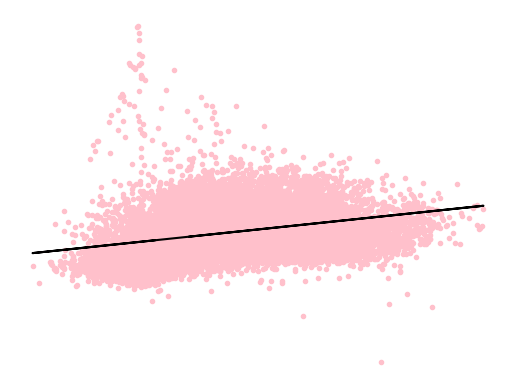

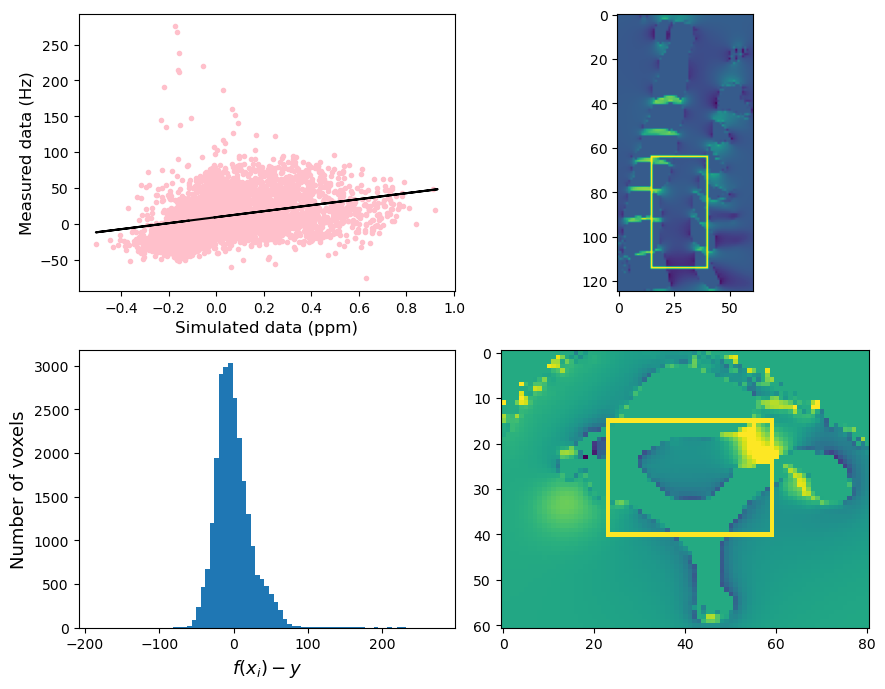

(25, 50, 36)


In [28]:
result_clean_FM1 = linear_reg_simexp_clean(fm_simu1 = simu_FM1 , fm_exp1 =FM1_final, mask_simu1 = simu_mask_FM1, mask_exp1=mask_FM1, part="FM1 clean", xmin = 10, ymin=15, zmin=23,  xmax=60, ymax=40, zmax=59)

######## regression linéaire - FM1 clean ############
 fm_exp = 21.006800135185582 * fm_simu + 14.961292465801645 
R^2 = 0.019861225744566894
p-value = 3.5981466289027024e-152
(-0.4719294786453247, 1.0162474393844605)
(-232.17013231776673, 273.3242754736745)


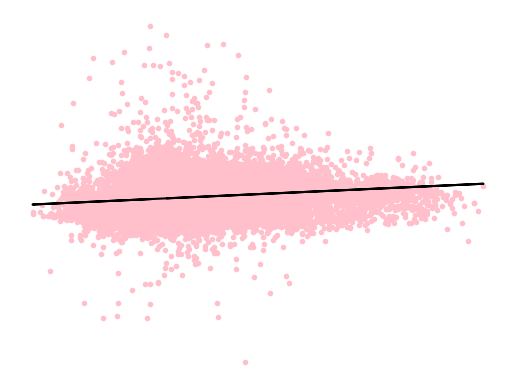

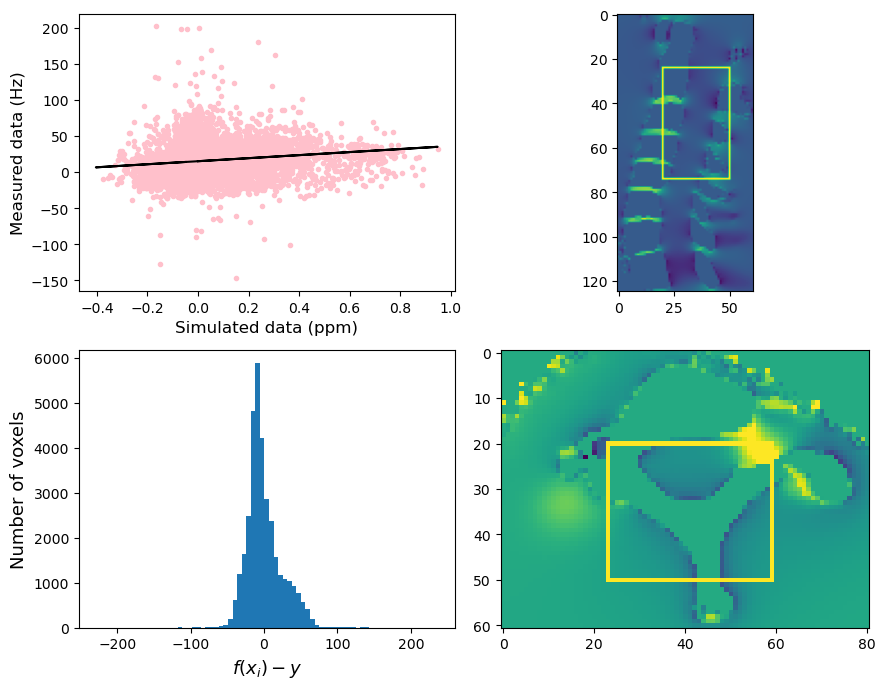

(30, 50, 36)


In [29]:
result_clean_FM1 = linear_reg_simexp_clean(fm_simu1 = simu_FM1 , fm_exp1 =FM1_final, mask_simu1 = simu_mask_FM1, mask_exp1=mask_FM1, part="FM1 clean", xmin = 50, ymin=20, zmin=23,  xmax=100, ymax=50, zmax=59)

## Gradients along the z direction

In [30]:
def gradient_fm_z_doublemask(fm, mask, material='', plot=True, vmin=-50, vmax=50, vmin_fm=-20, vmax_fm=60):
    '''
    Compute the z-gradient of the FM

    Parameters
    ----------
    fm : numpy.ndarray
        3D array of the field map we want to compute the gradient of.
    mask : numpy.ndarray
        3D array of the mask of the FM.
    material : str, otpional
        description of the compound. The default is ''.
    plot : bool, optional
        if True, plot the z-gradient. The default is True.
    vmin : int, optional
        lower limit of the gradient's color scale. The default is -50.
    vmax : int, optional
        higher limit of the gradient's color scale. The default is 50.
    vmin_fm : int, optional
        lower limit of the FM's color scale. The default is -20.
    vmax_fm : int, optional
        higher limit of the FM's color scale. The default is 60.

    Returns
    -------
    gradient : numpy.ndarray
        z-gradient of the FM.

    '''
    ### correction : we will apply a mask to exclude the vertebrae from both fm and fm_shifted
    mask_shift = np.roll(mask, 1, axis=1)
    maske = mask * mask_shift     
    
    fm_shifted = np.roll(fm, 1, axis=1) # shift from 1 voxel

    # print(np.shape((fm_shifted - fm)))
    gradient = (fm_shifted - fm) * maske
    m,n,p = np.shape(gradient)
    
    if plot==True: 
        plt.figure(figsize=(13,4))
        plt.subplot(1,3,1)
        plt.imshow((fm*mask)[:,:, p//2], vmin=vmin_fm, vmax=vmax_fm)
        plt.colorbar()
        plt.title(f'Field map (Hz) {material}')
        plt.subplot(1,3,2)
        plt.imshow((gradient)[:,1:, p//2], vmin=vmin, vmax=vmax)
        plt.colorbar()
        plt.title(f'Gradient of the fm {material} in the B0 direction')
        plt.subplot(1,3,3)
        plt.imshow(abs(gradient)[:,1:, p//2], vmin=0, vmax=vmax)
        plt.colorbar()
        plt.title(f'absolute gradient of the fm {material} in the B0 direction')
        plt.tight_layout()
    return gradient

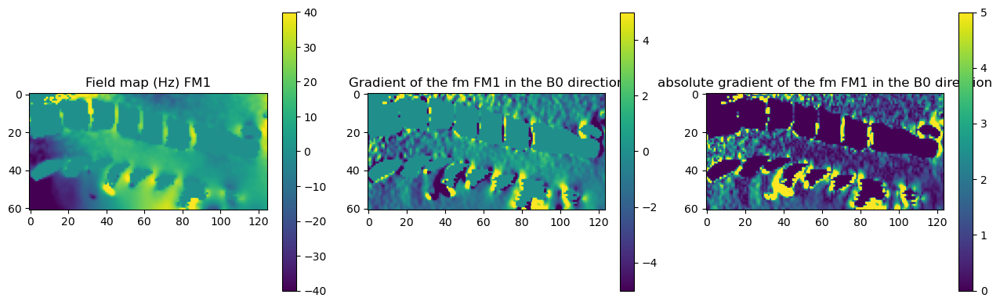

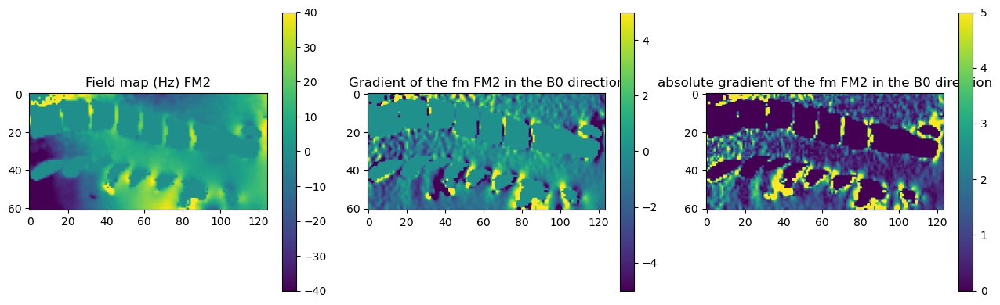

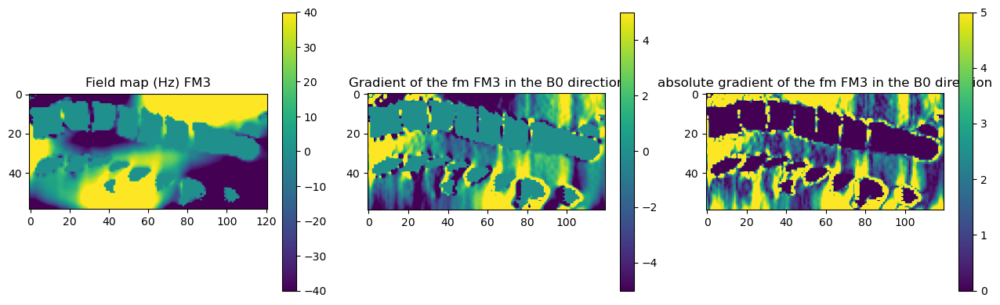

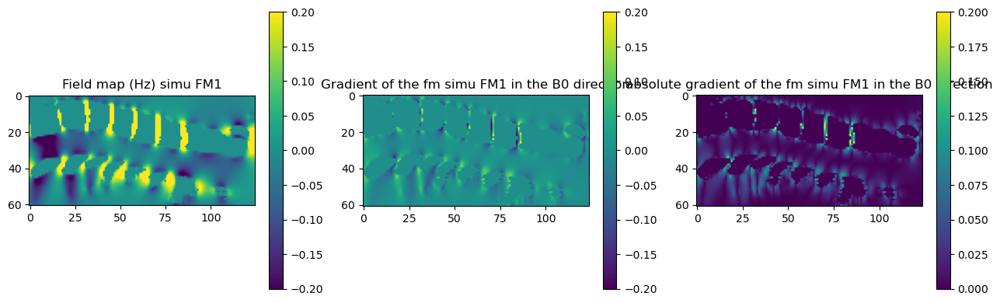

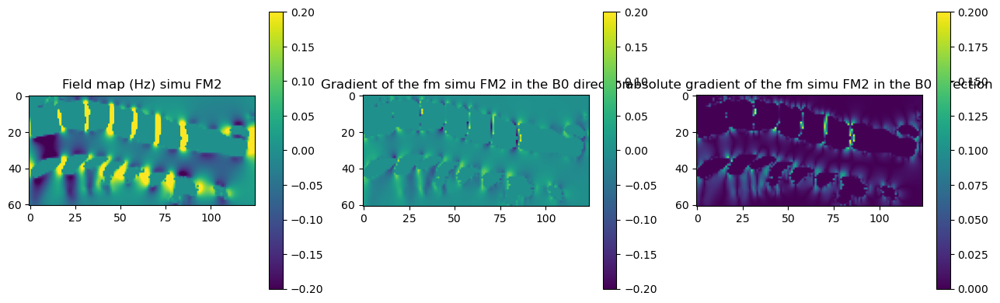

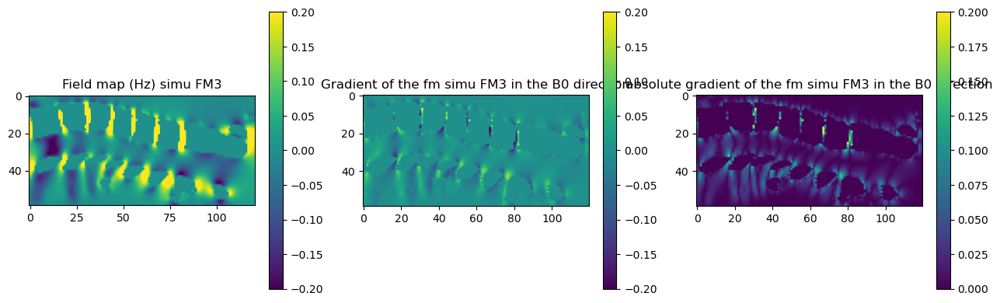

In [31]:
gradient_FM1 = gradient_fm_z_doublemask(gaussian_filter(FM1_final, sigma=0.75), mask_FM1, material='FM1', plot=True, vmin=-5, vmax=5, vmin_fm=-40, vmax_fm=40)
gradient_FM2 = gradient_fm_z_doublemask(gaussian_filter(FM2_final, sigma=0.75), mask_FM2, material='FM2', plot=True, vmin=-5, vmax=5, vmin_fm=-40, vmax_fm=40)
gradient_FM3 = gradient_fm_z_doublemask(gaussian_filter(FM3_final, sigma=0.75), mask_FM3, material='FM3', plot=True, vmin=-5, vmax=5, vmin_fm=-40, vmax_fm=40)
gradient_simu_FM1 = gradient_fm_z_doublemask(gaussian_filter(simu_FM1, sigma=0.75), simu_mask_FM1, material='simu FM1', plot=True, vmin=-0.2, vmax=0.2, vmin_fm=-0.2, vmax_fm=0.2)
gradient_simu_FM2 = gradient_fm_z_doublemask(gaussian_filter(simu_FM2, sigma=0.75), simu_mask_FM2, material='simu FM2', plot=True, vmin=-0.2, vmax=0.2, vmin_fm=-0.2, vmax_fm=0.2)
gradient_simu_FM3 = gradient_fm_z_doublemask(gaussian_filter(simu_FM3, sigma=0.75), simu_mask_FM3, material='simu FM3', plot=True, vmin=-0.2, vmax=0.2, vmin_fm=-0.2, vmax_fm=0.2)


In [32]:
def plot_and_save_gradient(gradient_fm, gradient_simu, save=False, vmin=-4, vmax=4, vmin_simu = -0.3, vmax_simu =0.3):
    '''
    Plot the relative and absolute z gradients of the FM acquired and of the simu

    Parameters
    ----------
    gradient_fm : numpy.ndarray
        z-gradient of the FM.
    gradient_simu : numpy.ndarray
        z-gradient of the simu.    
    save : bool, optional
        If True, save the images. The default is False.
    vmin : float, optional
        minimum scale of the colormap of the gradient from the acquisition. The default is -4.
    vmax : float, optional
        minimum scale of the colormap of the gradient from the acquisition. The default is 4.
    vmin_simu : float, optional
        minimum scale of the colormap of the gradient from the simu. The default is -0.3.
    vmax_simu : float, optional
        minimum scale of the colormap of the gradient from the simu. The default is 0.3.
    Returns
    -------
    None.

    '''
    
    fig=plt.figure(figsize=(12,10))
#     ymin, ymax = 1, 79
#     xmin, xmax = 1, 69
    fig.patch.set_facecolor('white')
    m,n,p = np.shape(gradient_fm)

    slice = p//2

    plt.figure()
    plt.imshow(np.transpose(gradient_simu[:,::-1,slice]), vmin=vmin_simu, vmax=vmax_simu) #, aspect='auto')
    plt.title('Simulated corrected gradient ($Hz/mm$)', size=15)
#     plt.ylim(ymax,ymin)
#     plt.xlim(xmin,xmax)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=13)
    plt.text(x= 3.5 ,y=3, s='a)', size=15)
    if save==True:
        tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\test8_Billy_gradient\test8_Billy_gradient_1.tex",)


    # plt.subplot(2,2,2)
    plt.figure()
    plt.imshow(np.transpose(gradient_fm[:,::-1,slice]), vmin=vmin, vmax=vmax)#, aspect='auto')
    plt.title('Measured gradient ($Hz/mm$)', size=15)
#     plt.ylim(ymax,ymin)
    plt.axis('off')
#     plt.xlim(xmin,xmax)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=13)
    plt.text(x= 3.5 ,y=3, s='b)', size=15)
    if save==True:
        tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\test8_Billy_gradient\test8_Billy_gradient_2.tex",)


    # plt.subplot(2,2,3)
    plt.figure()
    plt.imshow(abs(np.transpose(gradient_simu[:,::-1,slice])), vmin=-0, vmax=vmax_simu) #, aspect='auto')
    plt.title('Absolute simulated gradient ($Hz/mm$)', size=15)
#     plt.ylim(ymax,ymin)
    plt.axis('off')
#     plt.xlim(xmin,xmax)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=13)
    plt.text(x= 3.5 ,y=3, s='c)', size=15)
    if save==True:
        tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\test8_Billy_gradient\test8_Billy_gradient_3.tex",)


    # plt.subplot(2,2,4)
    plt.figure()
    plt.imshow(abs(np.transpose(gradient_fm[:,::-1,slice])), vmin=0, vmax=vmax)#, aspect='auto')
    plt.title('Absolute measured gradient ($Hz/mm$)', size=15)
#     plt.ylim(ymax,ymin)
    plt.axis('off')
#     plt.xlim(xmin,xmax)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=13)
    plt.text(x= 3.5 ,y=3, s='d)', size=15)
    if save==True:
        tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\test8_Billy_gradient\test8_Billy_gradient_4.tex",)



    plt.tight_layout()
    # plt.savefig(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\TORONTO\abstract\images\gradients.png")

    plt.show()

<Figure size 1200x1000 with 0 Axes>

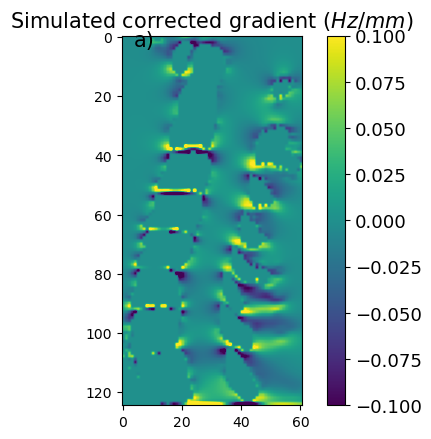

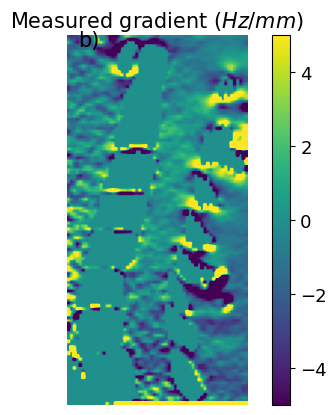

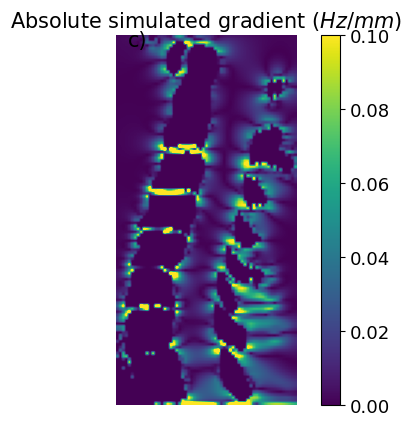

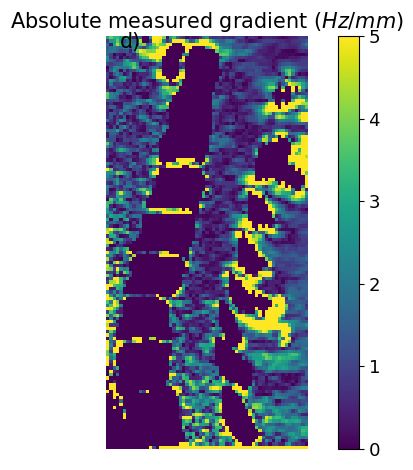

In [33]:
plot_and_save_gradient(gradient_FM1, gradient_simu_FM1, save=False, vmin=-5, vmax=5, vmin_simu=-0.1, vmax_simu=0.1)

<Figure size 1200x1000 with 0 Axes>

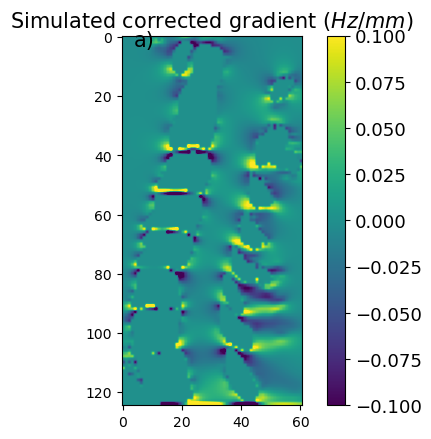

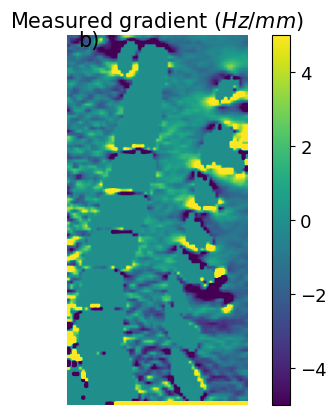

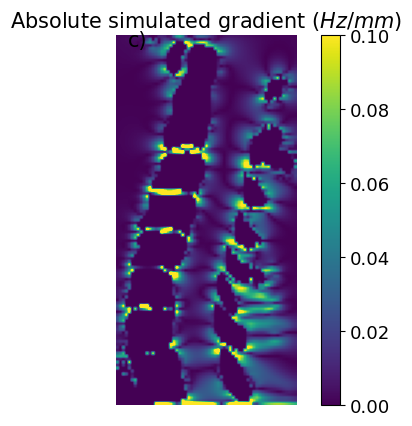

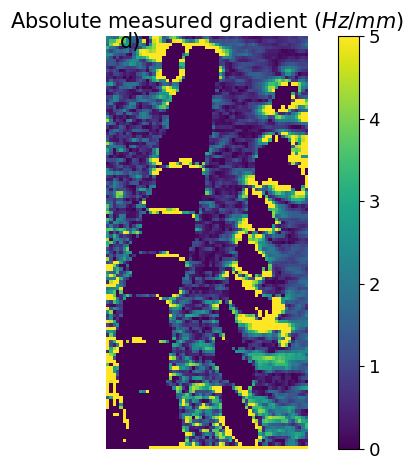

In [34]:
plot_and_save_gradient(gradient_FM2, gradient_simu_FM2, save=False, vmin=-5, vmax=5, vmin_simu=-0.1, vmax_simu=0.1)

<Figure size 1200x1000 with 0 Axes>

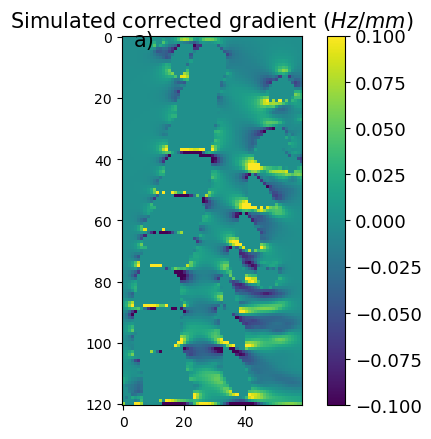

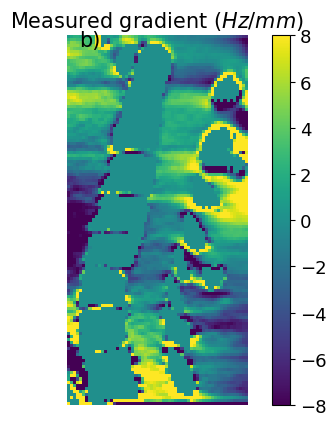

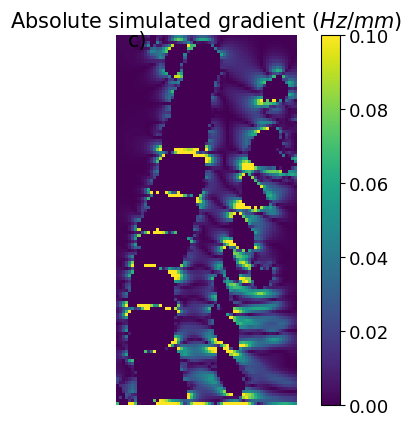

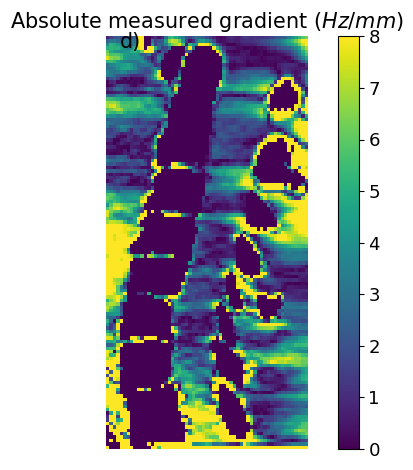

In [35]:
plot_and_save_gradient(gradient_FM3, gradient_simu_FM3, save=False, vmin=-8, vmax=8, vmin_simu=-0.1, vmax_simu=0.1)

# ME-GRE

In [36]:
path_6TE = [f"BILLY_PHANTOM_23_04_26\JOHANNA_BRUNNHILDE_20230426\MGE_5TE_MSMA_5X2SL_2MEAS_0020\MGE_5TE_MSMA_5X2SL_2MEAS_0020_MGE_5TE_msma_5x2sl_2meas_20230426150420_20_e{i}.nii.gz" for i in range(1,7) ]

(500, 540, 45)


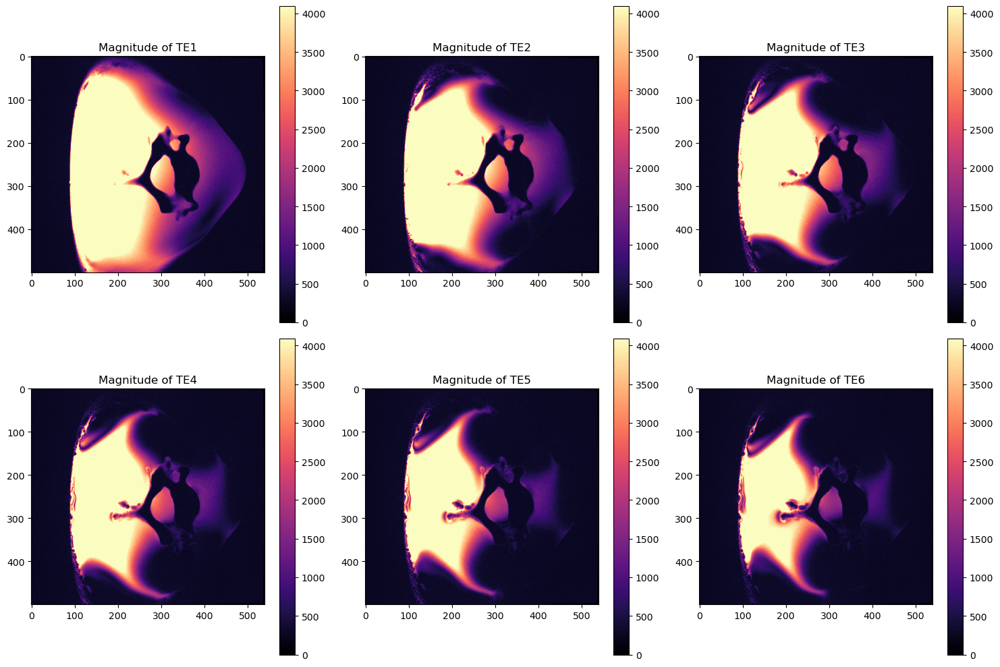

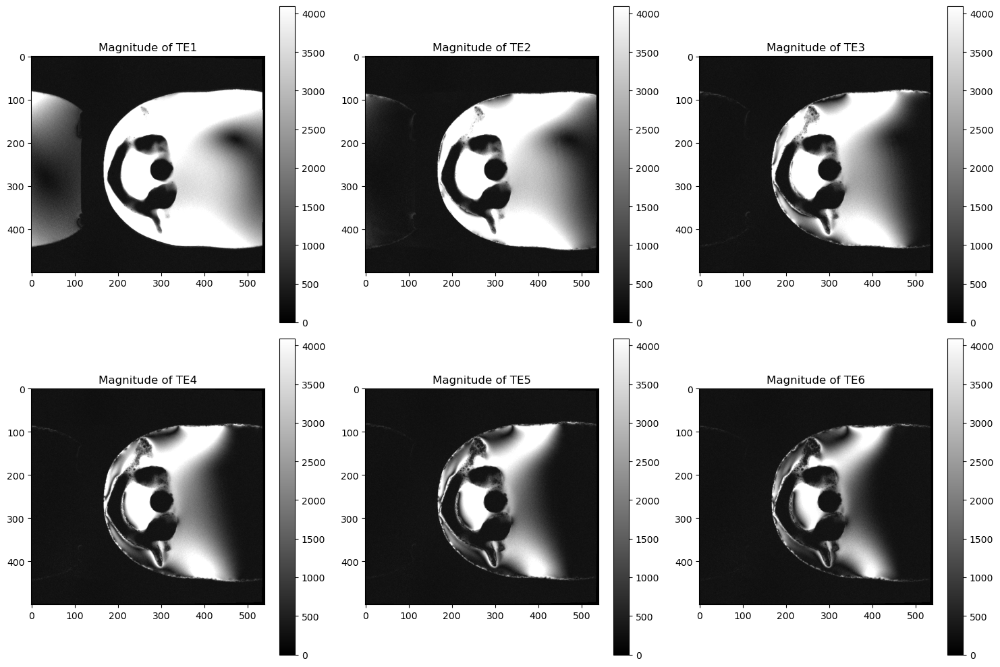

In [37]:
mag_12TE = [nib.load(path_6TE[i]).get_fdata() for i in range(6)]

plt.figure('6TE', figsize=(15,10))

for i in range(len(mag_12TE)):
    plt.subplot(2,3,i+1)
    plt.imshow(mag_12TE[i][:,:,15] , cmap='magma')
    plt.colorbar()
    plt.title(f'Magnitude of TE{i+1}')

plt.tight_layout()

print(np.shape(mag_12TE[0]))
plt.show()

plt.figure('6TE', figsize=(15,10))

for i in range(len(mag_12TE)):
    plt.subplot(2,3,i+1)
    plt.imshow(mag_12TE[i][:,:,38] , cmap='gray')
    plt.colorbar()
    plt.title(f'Magnitude of TE{i+1}')

plt.tight_layout()

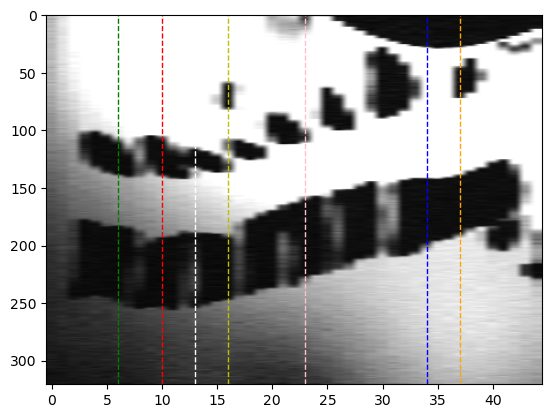

In [38]:
mag_rescaled = rescaling_FOV(mag_12TE[0], x=300, y=280, z=22, dx=160, dy=195, dz=22)

plt.imshow(mag_rescaled[180,:,:] , cmap='gray', aspect='auto') #vmin=0, vmax=1800, aspect='auto')
# plt.imshow(mag_rescaled[:,:,12] , vmin=0, vmax=1800, aspect='auto')

plt.axvline(x=10,color='r',linestyle='--', linewidth=1)
plt.axvline(x=6,color='g',linestyle='--', linewidth=1)
plt.axvline(x=16,color='y',linestyle='--', linewidth=1)
plt.axvline(x=34,color='b',linestyle='--', linewidth=1)
plt.axvline(x=13,color='w',linestyle='--', linewidth=1)
plt.axvline(x=23,color='pink',linestyle='--', linewidth=1)
plt.axvline(x=37,color='orange',linestyle='--', linewidth=1)


In [39]:
def multiTE_plot(x, mag_multiTE = mag_12TE, color='gray'):
    """
    Plot one transversal slice for the 6 different TE and their difference from the first image.

    Parameters
    ----------
    x : int
        x-coordinate of the slices to display
    mag_multiTE : list, optimal
        list of magnitude 3D arrays for each TE time. The default is mag_12TE.
    color : str, optional
        colormap to use for the images. The default is 'gray'.

    Returns
    -------
    None
        
    """
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 9))
    c=0
    for ax in axes.flat:
        mag_rescaled = rescaling_FOV(mag_multiTE[c], x=300, y=280, z=22, dx=160, dy=195, dz=22)      
        im = ax.imshow(mag_rescaled[:,:,x], cmap=color,vmin=201, vmax=4095)    #vmin=0, vmax=3200)
        ax.axis('off')
        c+=1
    fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

    # add an axes, lower left corner in [0.83, 0.1] measured in figure coordinate with axes width 0.02 and height 0.8
    cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    cbar = fig.colorbar(im, cax=cb_ax)
#     plt.savefig('figures/test6_ME_topC5')
    plt.show()
    
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 9))
    c=0
    M1 = rescaling_FOV(mag_multiTE[0], x=300, y=280, z=22, dx=160, dy=195, dz=22)      

    for ax in axes.flat:
        mag_rescaled = rescaling_FOV(mag_multiTE[c],x=300, y=280, z=22, dx=160, dy=195, dz=22)      
        im = ax.imshow((M1[:,:,x]-mag_rescaled[:,:,x]))#, vmin=10, vmax=1500)
        ax.axis('off')
        c+=1
    fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
                    wspace=0.02, hspace=0.02)

    # add an axes, lower left corner in [0.83, 0.1] measured in figure coordinate with axes width 0.02 and height 0.8
    cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    cbar = fig.colorbar(im, cax=cb_ax)

    plt.show()

############# TE1 to TE6 for a slice middle T1 (green) ################


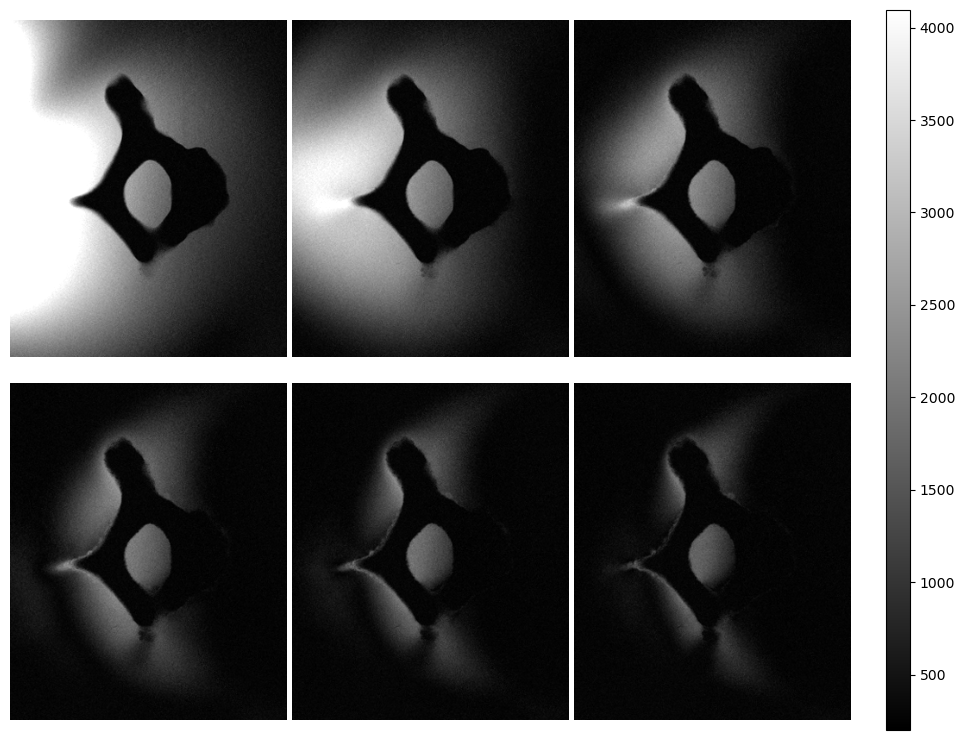

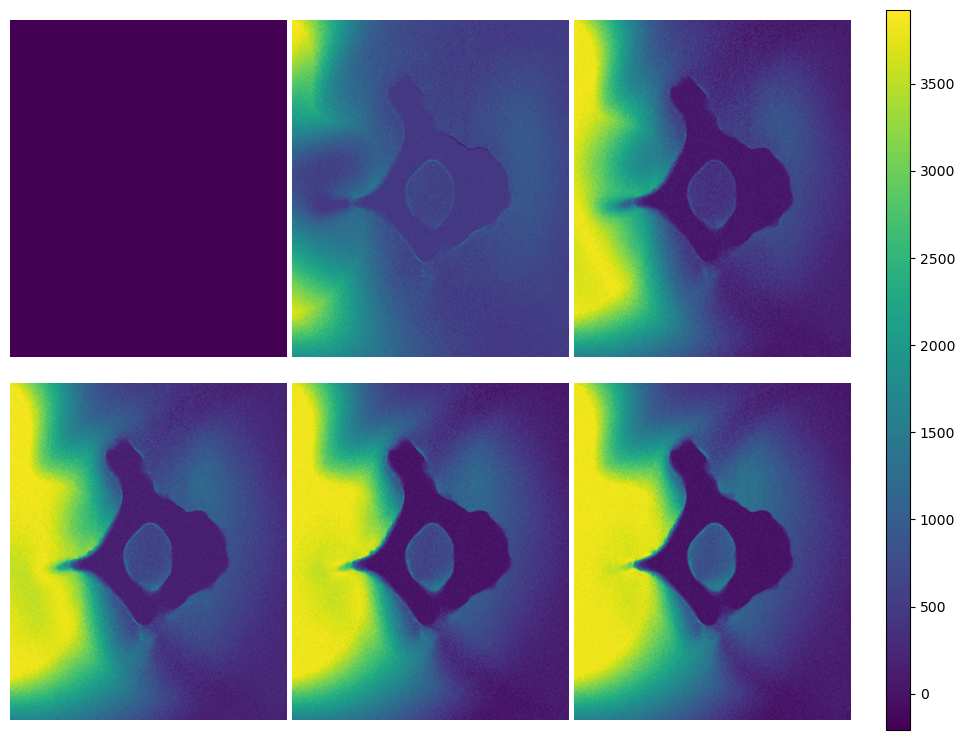

In [40]:
print('############# TE1 to TE6 for a slice middle T1 (green) ################')
multiTE_plot(6, mag_multiTE = mag_12TE)

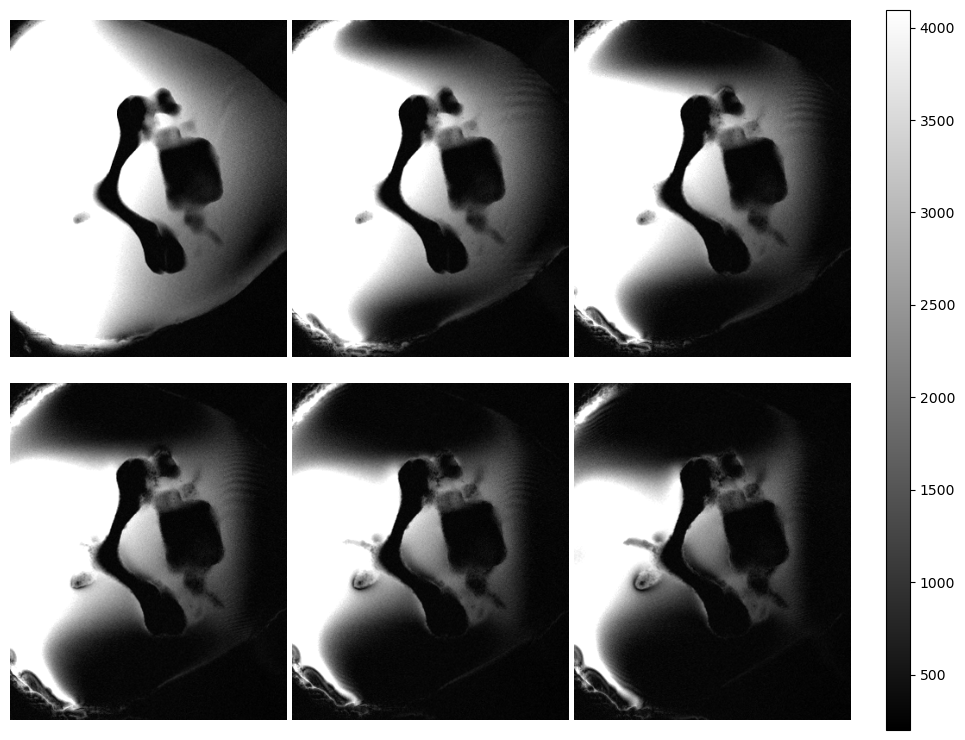

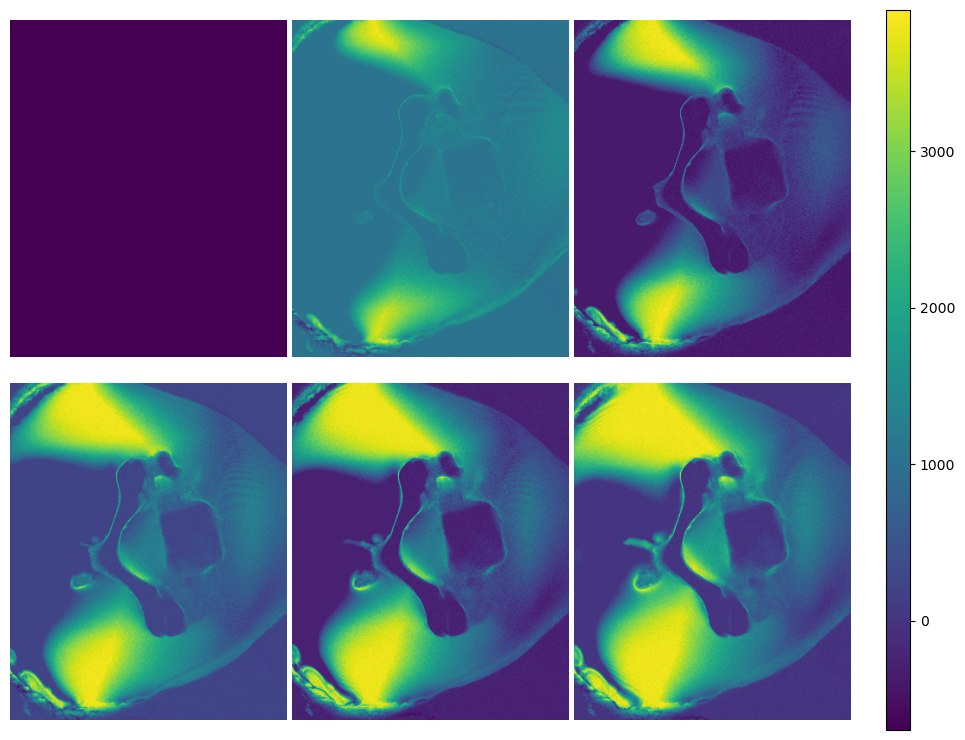

In [41]:
multiTE_plot(18, mag_multiTE = mag_12TE)

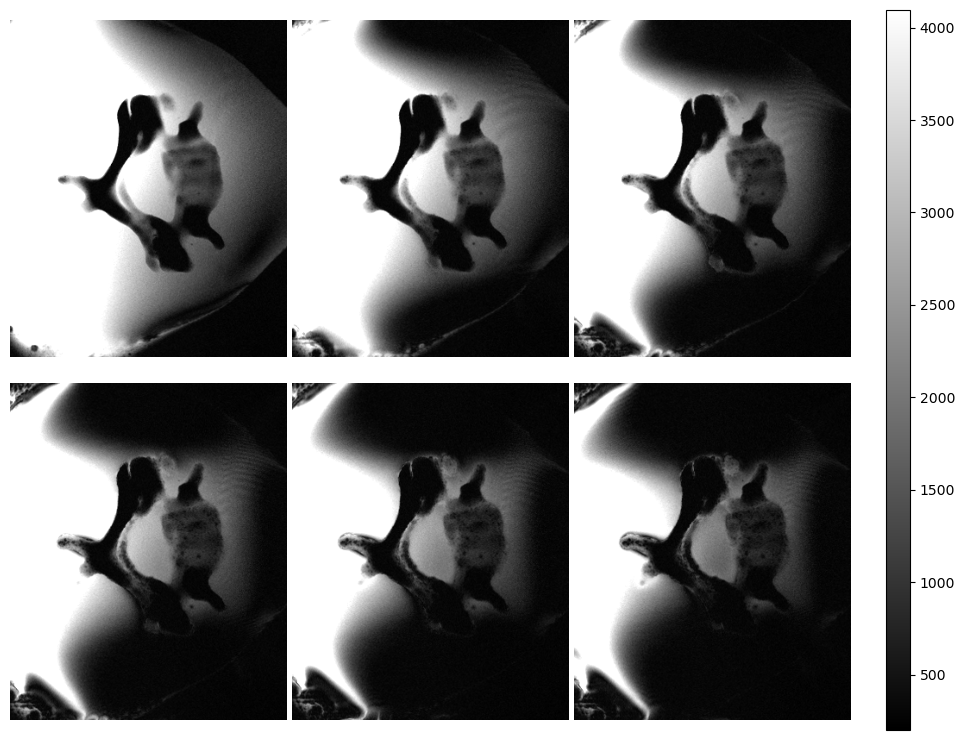

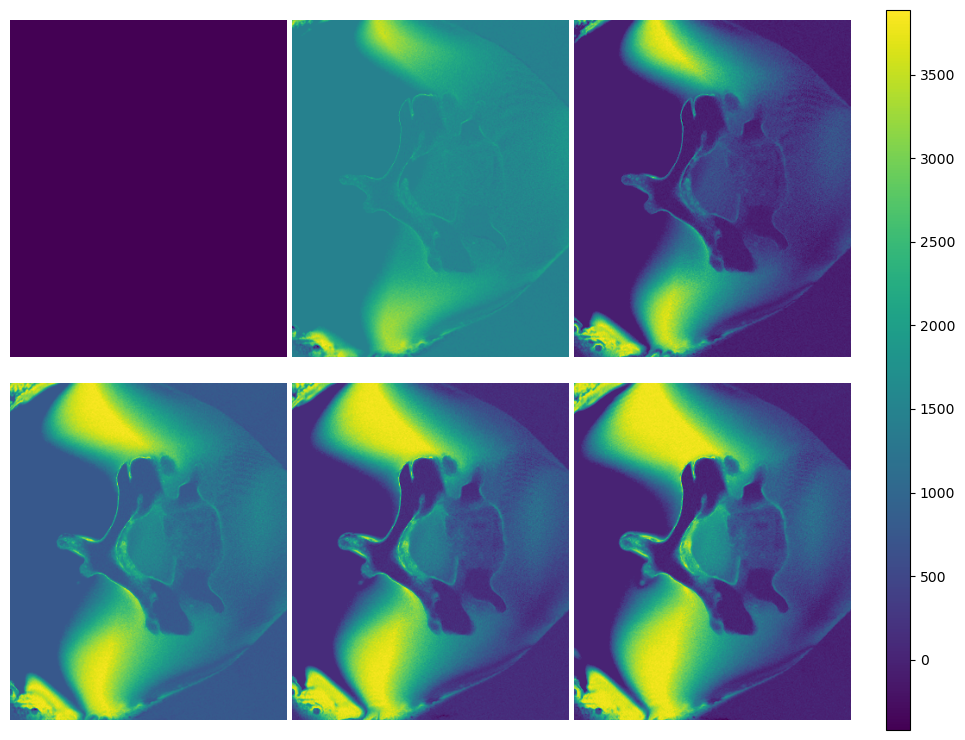

In [42]:
multiTE_plot(17, mag_multiTE = mag_12TE)

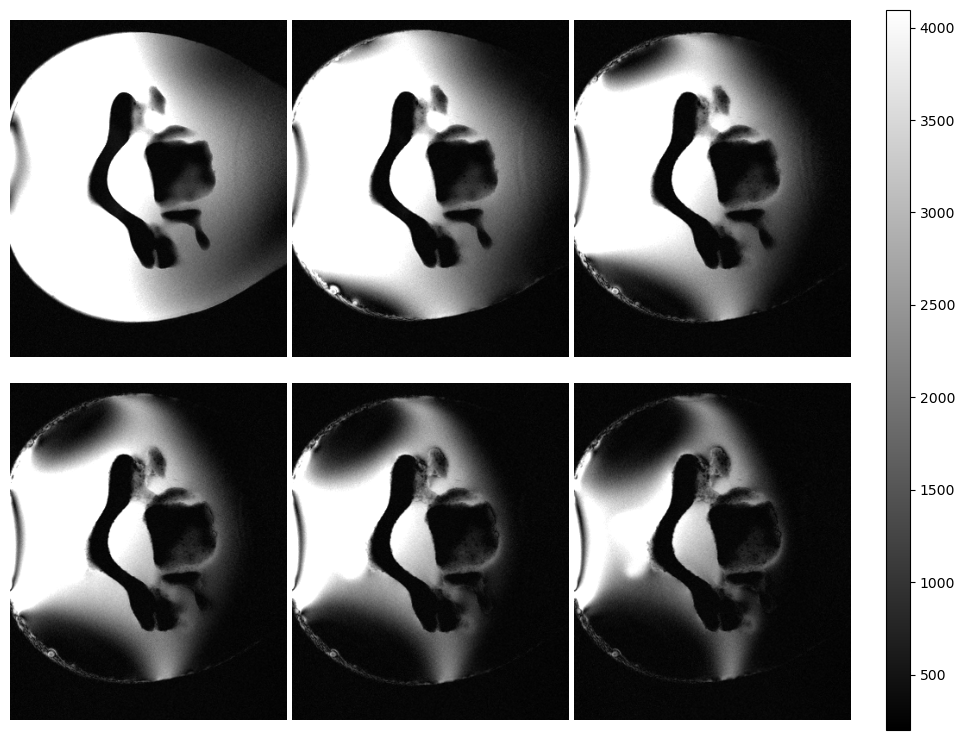

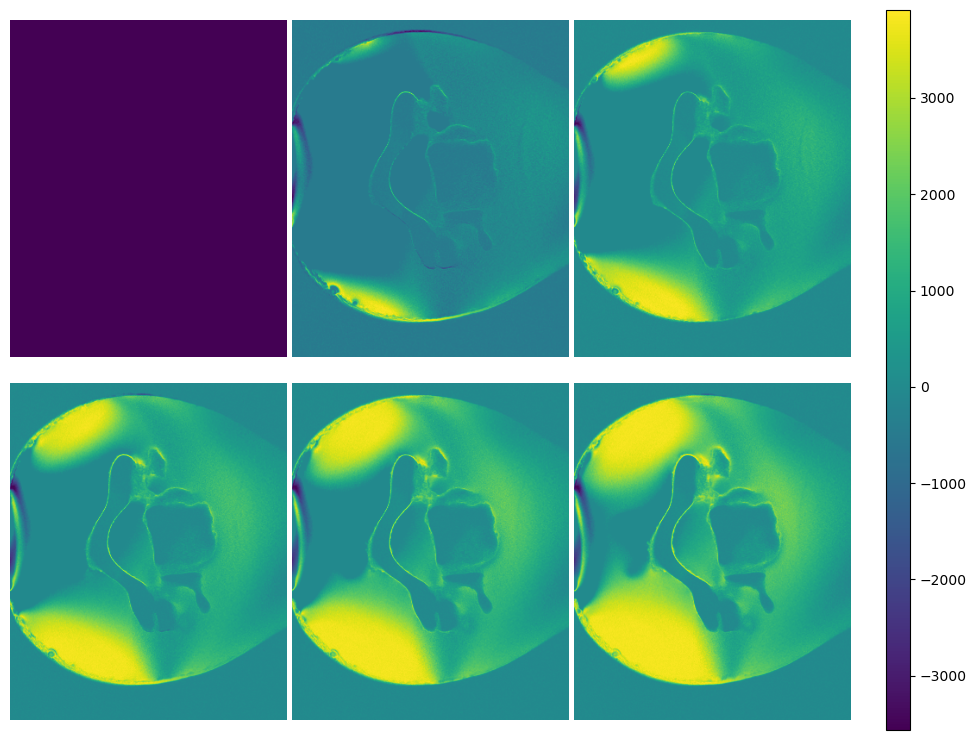

In [43]:
multiTE_plot(22, mag_multiTE = mag_12TE)

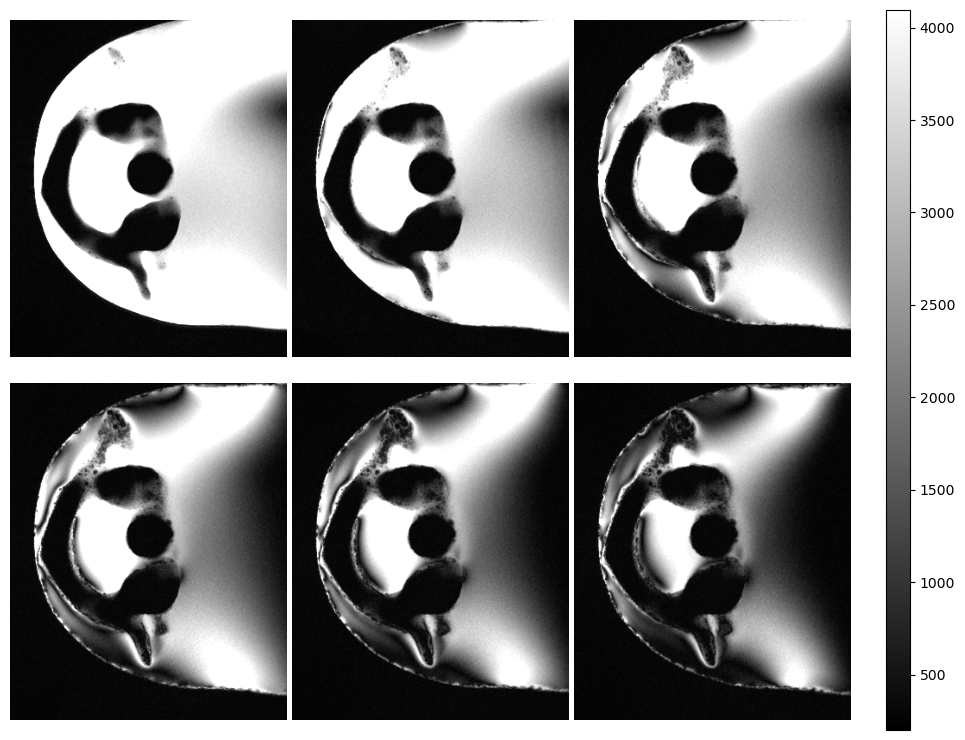

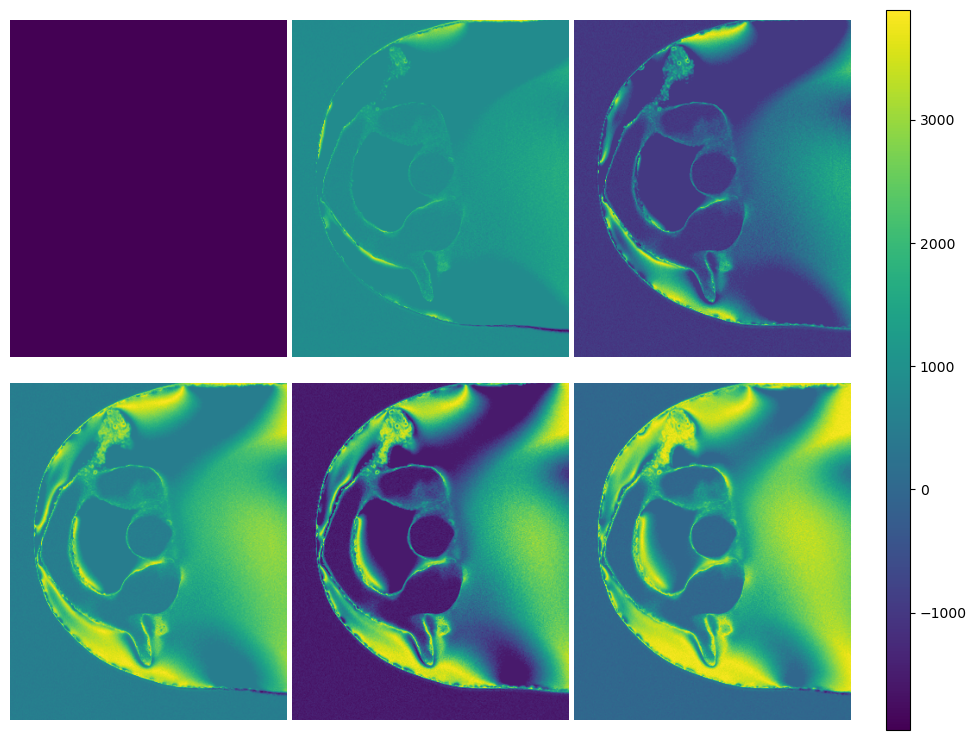

In [44]:
multiTE_plot(38, mag_multiTE = mag_12TE)

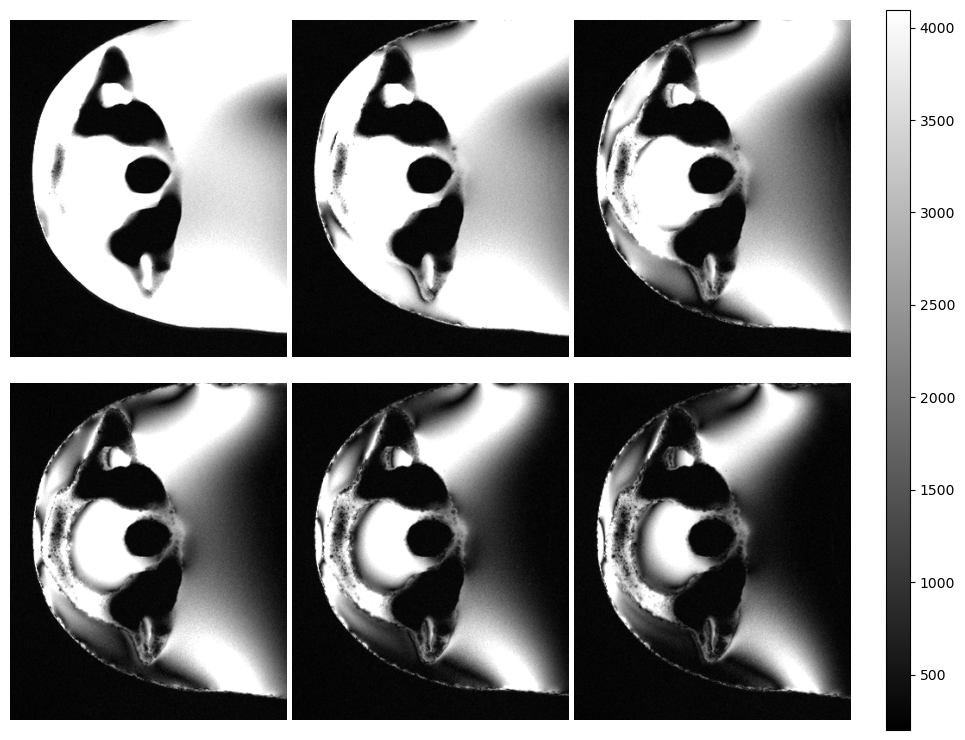

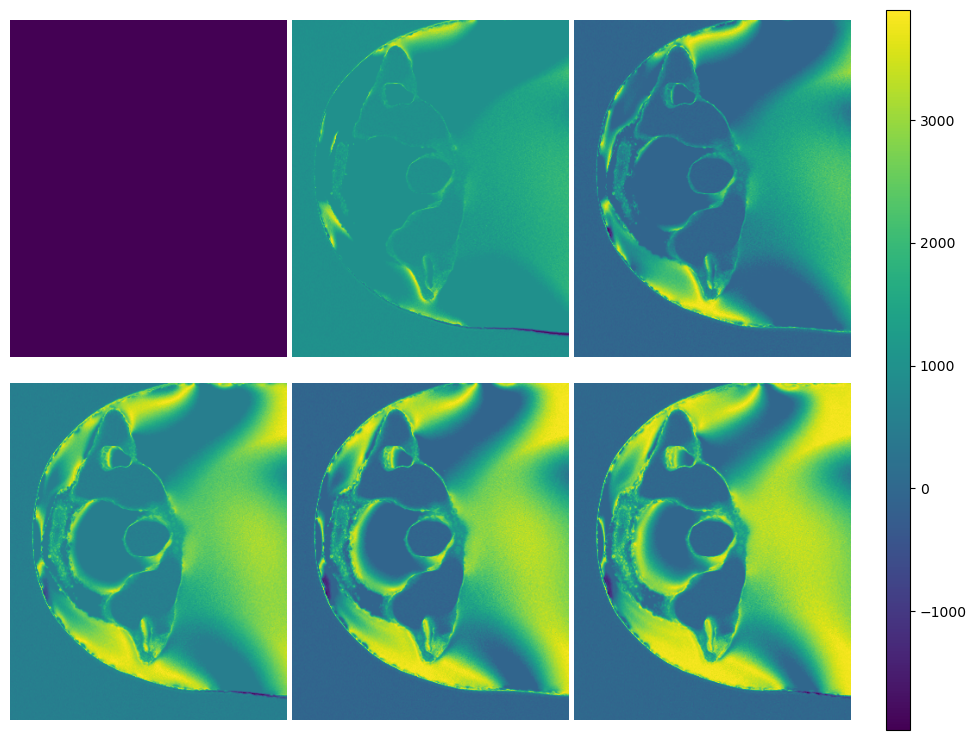

In [45]:
multiTE_plot(39, mag_multiTE = mag_12TE)

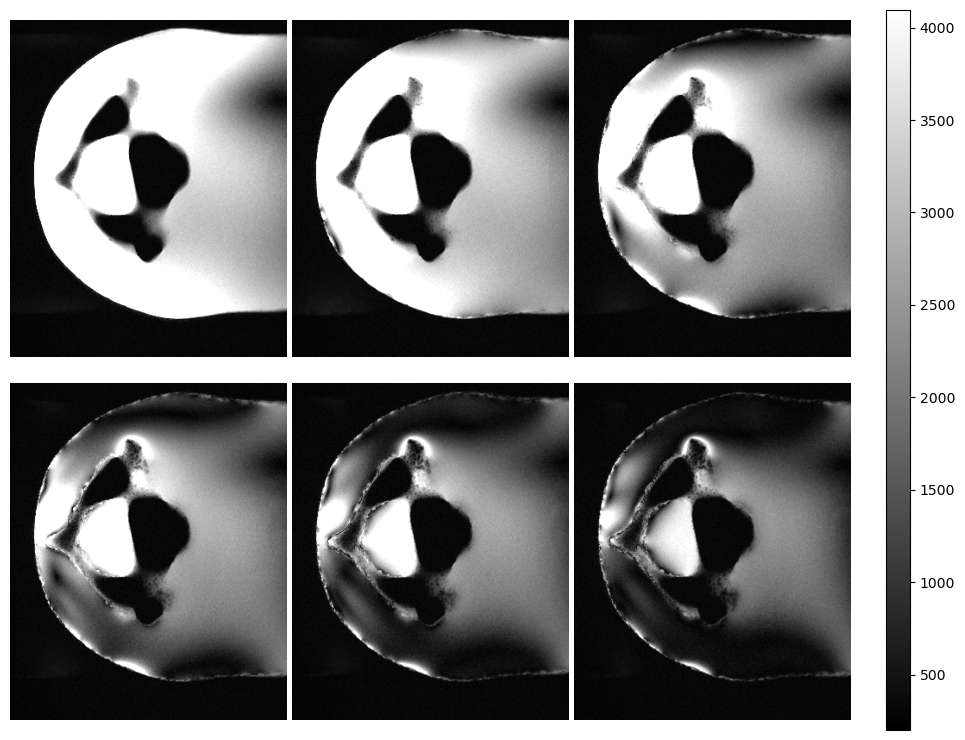

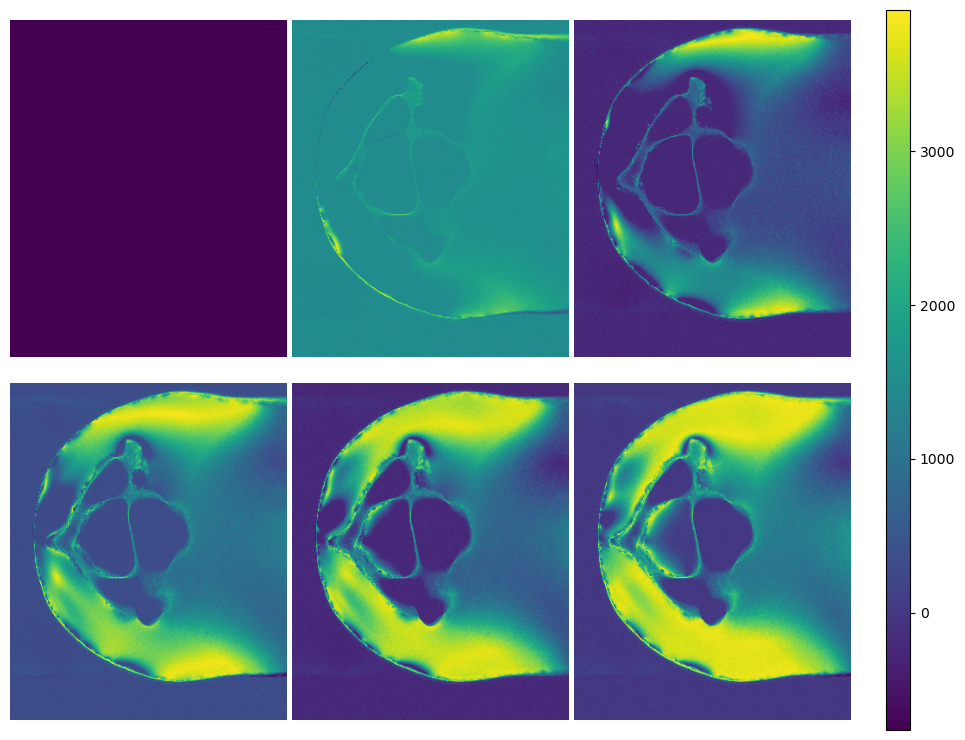

In [46]:
multiTE_plot(33, mag_multiTE = mag_12TE)

In [94]:
# multiTE_plot(6, mag_multiTE = mag_12TE)

In [93]:
# multiTE_plot(8, mag_multiTE = mag_12TE)

In [92]:
# multiTE_plot(9, mag_multiTE = mag_12TE)

In [91]:
# multiTE_plot(10, mag_multiTE = mag_12TE)

## $T_2^*$ -calcul

In [53]:
def T2_calcul(mag_12TE = mag_12TE, y = 180, x=150, z=5, plot_and_print=True):
    '''
    Compute the $T_2^*$ and associated $R^2$ value in one voxel

    Parameters
    ----------
    mag_12TE : numpy.ndarray
        4D array of the magnitudes of the 12 echos.
    y : int, optional
        y coordinate of the voxel. The default is 180.
    x : int, optional
        x coordinate of the voxel. The default is 150.
    z : int, optional
        z coordinate of the voxel. The default is 5.
    plot_and_print : bool, optional
        if True, print the results and plot the selected voxel and the fit. the default is True.
    

    Returns
    -------
    (T2_star, rSquared) : tulle of int
        tulle of the $T_2^*$ and associated $R^2$ of the selected voxel.

    '''
    
    m,n,p = np.shape(mag_12TE[0])
    TE = np.array([4.75, 13.50, 22.29, 31, 40, 48.68]) #ms
    echo = np.array([mag_12TE[i][y][x][int(z)] for i in range(6)])  #we first try t find the T2 value on one voxel

    def monoExp(t, A, T2_star, b):
        return A * np.exp(-t / T2_star) +b

    # perform the fit
    # p0 = (1, 1) # start with values near those we expect
    params, cv = scipy.optimize.curve_fit(monoExp, TE, echo, bounds=(0, [5000, 500, 500]), maxfev=5000)
    A, T2_star, b = params

    # determine quality of the fit
    squaredDiffs = np.square(echo - monoExp(TE, A, T2_star, b))
    squaredDiffsFromMean = np.square(echo - np.mean(echo))
    rSquared = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)


    if plot_and_print == True:
        plt.figure()
        plt.imshow(mag_12TE[0][:,:,int(z)])
        plt.axvline(x=x)
        plt.axhline(y=y)
        plt.colorbar()

        plt.figure()
        plt.plot(TE, echo, "+")
        plt.plot(TE, monoExp(TE, A, T2_star, b), '--', label="fitted")
        plt.title("Fitted Exponential Curve")
        print(f'parameters = {params}')
        print(f"R² = {rSquared}")
    
        # inspect the parameters
        print(f"echo = {A} * e^(-t/{T2_star}) +{b}")
    
    return (T2_star, rSquared)

parameters = [2193.8908327     7.49091535  277.2891156 ]
R² = 0.9902649034548907
echo = 2193.8908327035133 * e^(-t/7.490915350715482) +277.2891156049704


(7.490915350715482, 0.9902649034548907)

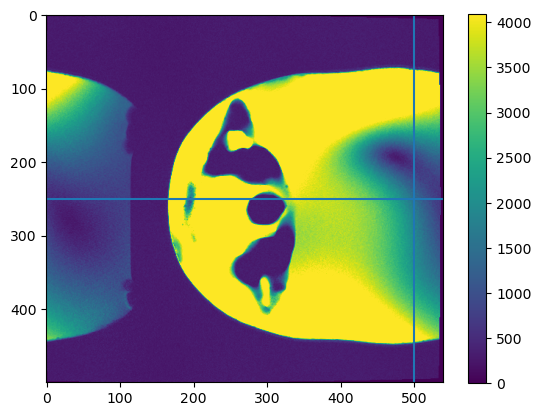

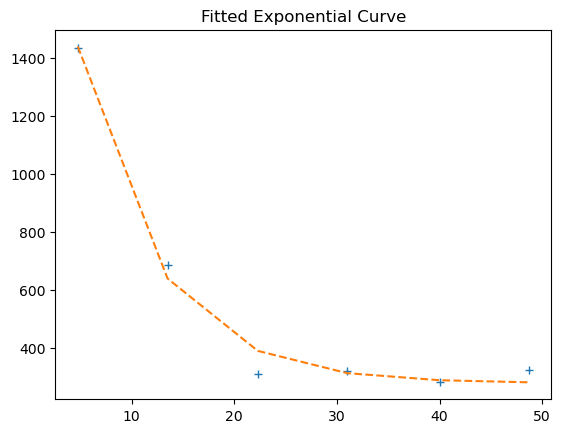

In [74]:
T2_calcul(mag_12TE, x=500, y=250, z= 39)

parameters = [2.08756422e+03 9.81228726e+01 2.16565500e-13]
R² = 0.9921416023152497
echo = 2087.5642166510206 * e^(-t/98.12287258372699) +2.1656549955352763e-13


(98.12287258372699, 0.9921416023152497)

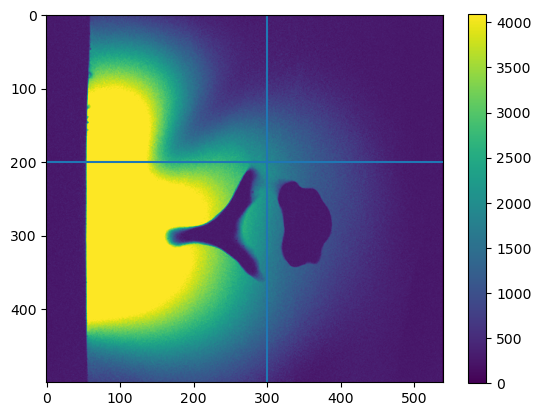

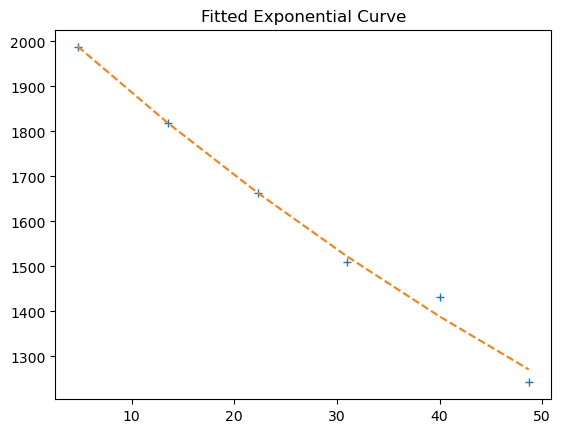

In [80]:
T2_calcul(mag_12TE, x=300, y=200, z= 4)

In [82]:
slice_z = 4

m,n,p = np.shape(mag_12TE[0])
T2_star_map = np.zeros((m,n))
rsquared_map = np.zeros((m,n))

for i in tqdm.tqdm(range(m)):
    for j in (range(n)):
            if mag_12TE[0][i][j][slice_z] > 750:
                T2_star_map[i][j], rsquared_map[i][j] = T2_calcul(mag_12TE = mag_12TE,y = i, x=j, z=slice_z, plot_and_print=False)


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [21:23<00:00,  2.57s/it]


(-0.5, 539.5, 499.5, -0.5)

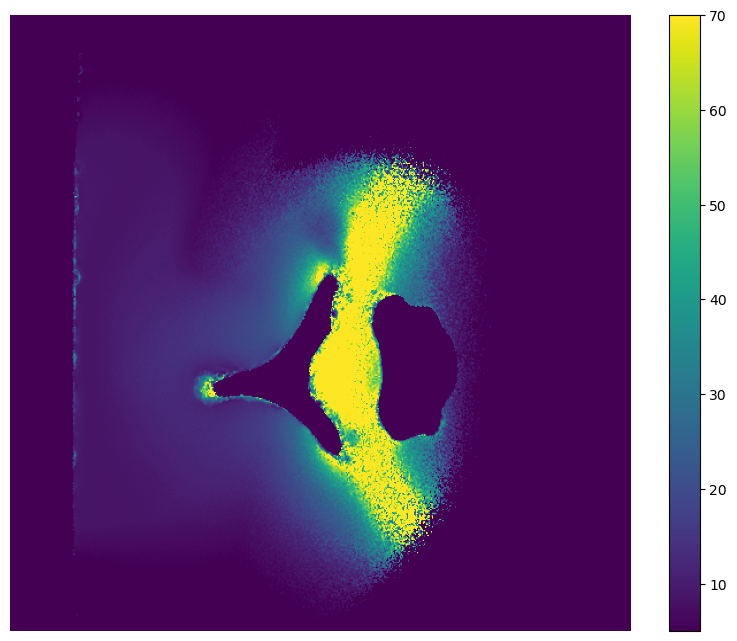

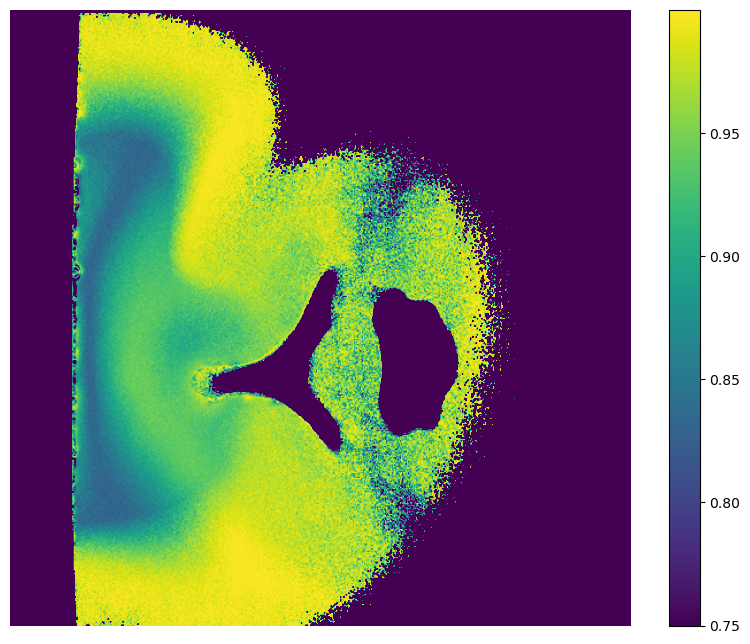

In [90]:
plt.figure(figsize=(10,8))
plt.imshow(T2_star_map[:,:], aspect="auto", vmin=5, vmax=70)
plt.colorbar()
plt.axis('off')
# tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\test6_vertebrae\test6_T2_star_map_1.tex")


plt.figure(figsize=(10,8))
plt.imshow(rsquared_map[:,:], aspect="auto", vmin=0.75)
plt.colorbar()
plt.axis('off')
# tikzplotlib.save(r"C:\Users\b\OneDrive\Documents\NTNU\Master's thesis\presentations\master_thesis_PR\fig\fig_results\test6_vertebrae\test6_T2_star_map_2.tex")
